In [1]:
import torch
from torch.autograd import Variable
import numpy as np
import pylab as plt
%matplotlib inline
import torchvision.utils as vutils
import glob

In [2]:
import sys
sys.path.append('../')
import models
import models.mnist
from data import get_loaders
from utils import DictWrapper

In [3]:
%load_ext autoreload
%autoreload 1

In [644]:
%aimport log_plotter
from log_plotter import get_run_names, get_data, get_data_pth, plot_smooth, plot_tag, plot_runs_and_tags, get_legend, plot_smooth_o1, plot_smooth_o2, plot_clusters_online, plot_smooth_shade

In [9]:
save_single = False
plt.rcParams.update({'font.size': 12})

In [6]:
save_single = True
plt.rcParams.update({'font.size': 16})

In [1021]:
save_single = True
no_title = True

In [1028]:
save_single = False
no_title = False

# linreg

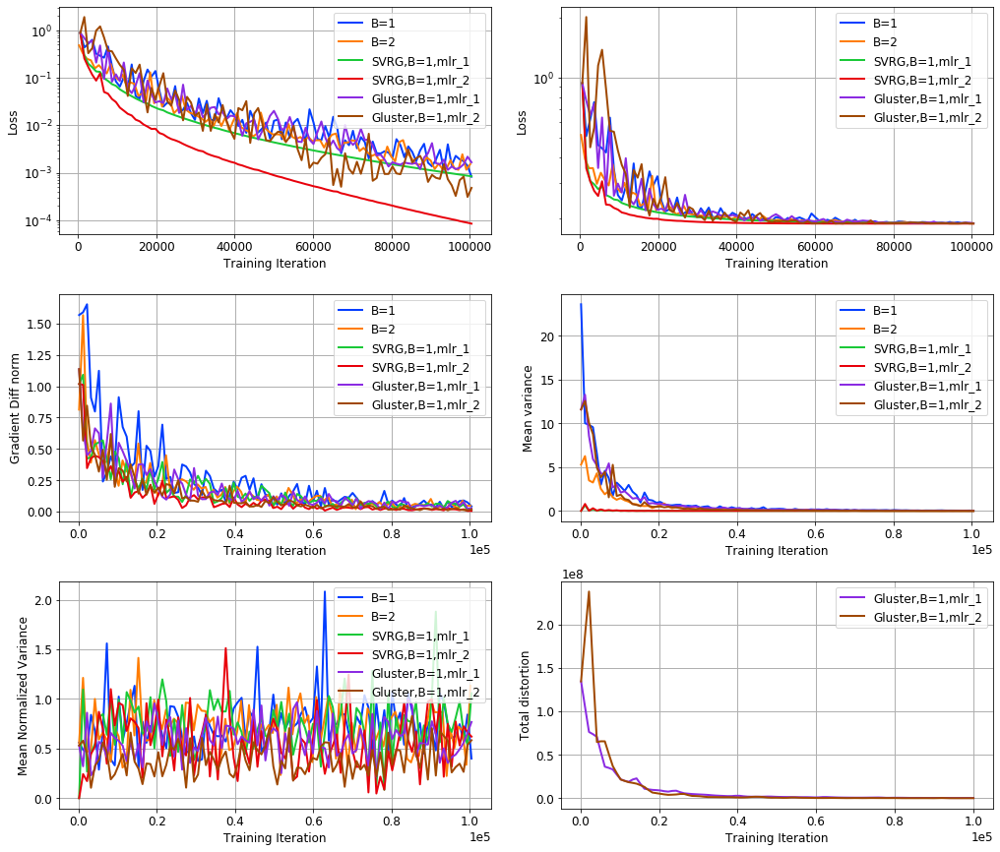

In [20]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5/.*seed_123']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/linreg.png'
lg_tags = ['sgd,sgd', 'svrg', 'gluster', 'batch_size', 'mlr']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = None
no_title = True
lg_replace = [('sgd,sgd', 'sgd'), ('sgd,', ''), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

- svrg is always better, of course, it is asymp batch gd
- gluster from one step to another cannot do anything, so B<C is not good in linreg

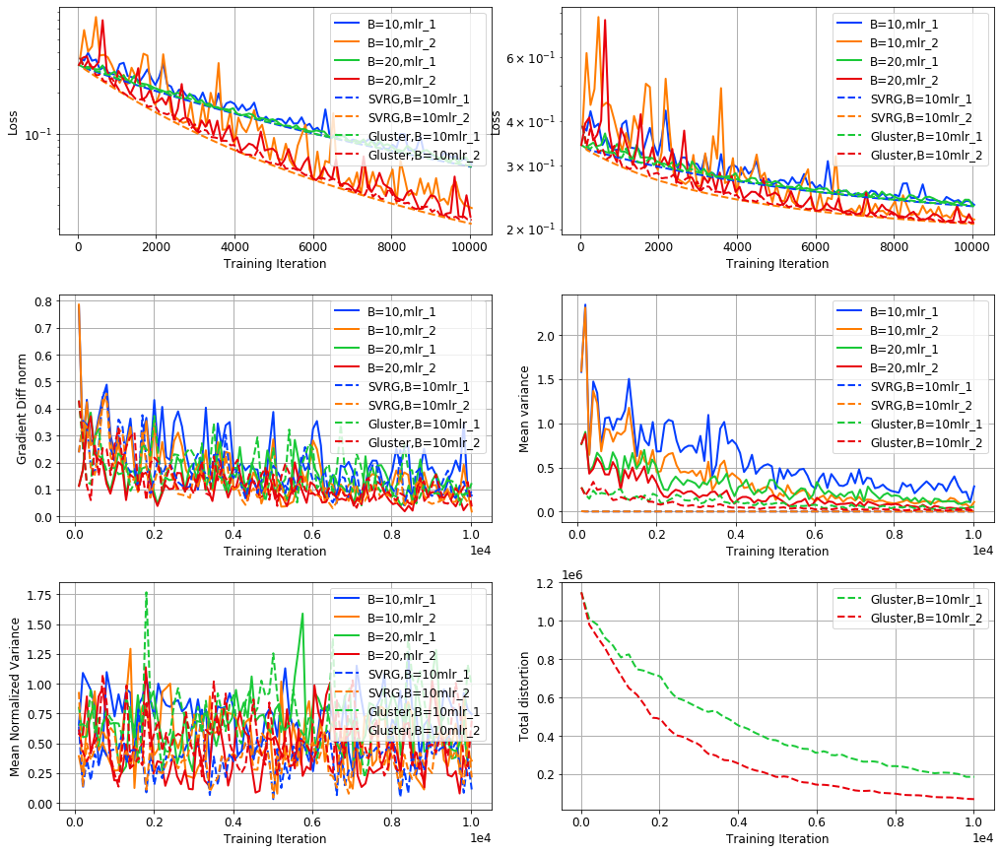

In [27]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/linreg.png'
lg_tags = ['sgd,sgd', 'svrg', 'gluster', 'batch_size', 'mlr']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = True
lg_replace = [('sgd,sgd', 'sgd'), ('sgd,', ''), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

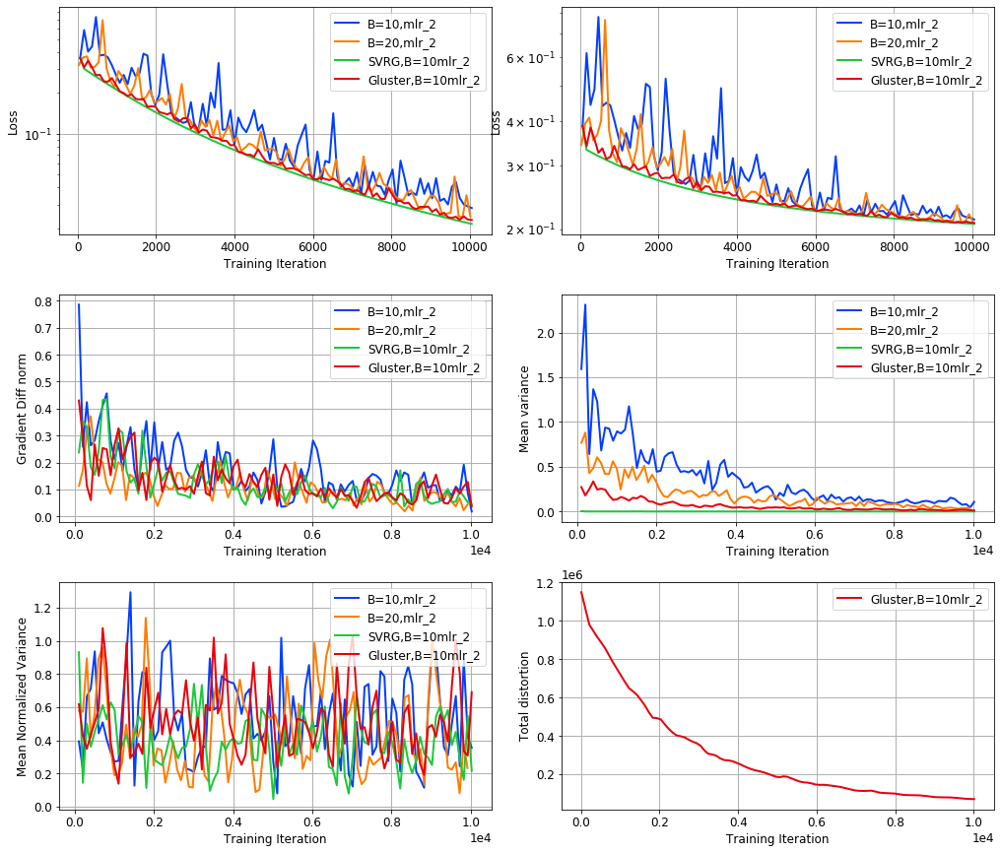

In [29]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10/.*mlr_2']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/linreg.png'
lg_tags = ['sgd,sgd', 'svrg', 'gluster', 'batch_size', 'mlr']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = True
lg_replace = [('sgd,sgd', 'sgd'), ('sgd,', ''), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

- gluster is doing as well as svrg
- lr 2 is just enough, one lr that shows sgd as the edge of blow-up
- variance is low for 2B then gluster then svrg, all good
- distortion goes down, it is batch gluster so everything is good
- let's run it for longer to get to saturation of sgd

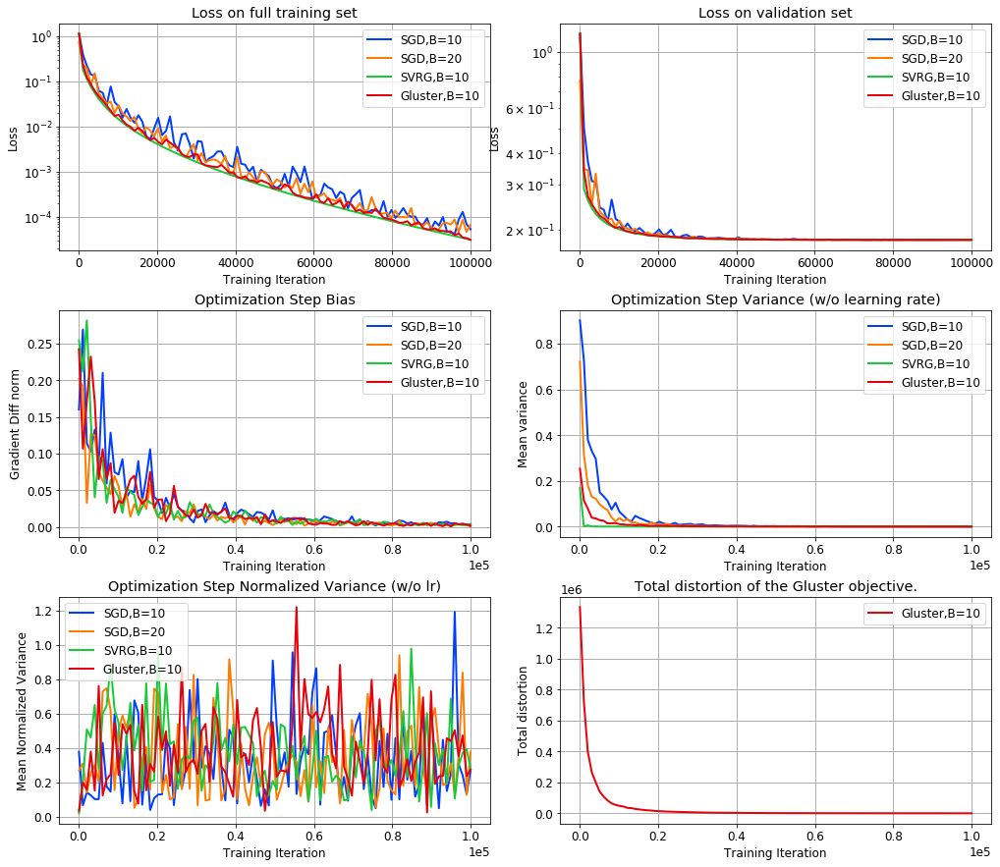

In [36]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10_lr5e-5/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/linreg.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

- batch size 10 is because of gluster, if it were just svrg, batch size 1 also shows its benefit
- current linreg is $w_*^T X + \epsilon$, where $w_*=0$
- for $\gamma>1$ bias is 0 and SGD can overfit to the training data, hence constant decrease we see above
- validation loss does include the bayes risk, it will not go down to zero

# todos
- is this right? batch GD being as good as SGD
- doing transformer has higher priority, if that works it is icml submission, if not, I just need linreg for arxiv
- instead of linreg try rosenbrock
- consider other SNR and $\gamma$, eg. $\gamma<1$, here $\gamma=2$
- try duplicates
- what is the variance of double lr? is it smaller? it should be because the grad is a function of current w and double lr will converge faster, however, after saturation, decreasing lr should decrease the variance.

## linreg corrected noise model, snr=5, nonzero w_*, $\gamma=2$

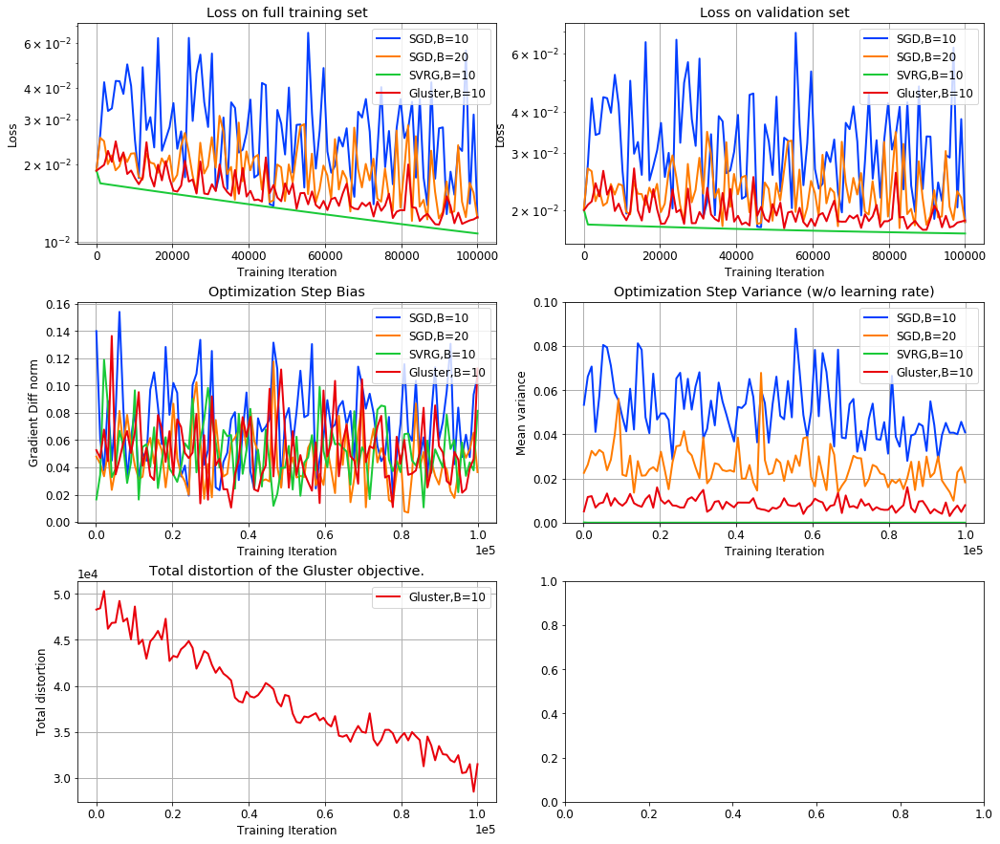

In [475]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10_lr5e-5_snr_10/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var', 'gb_td']
fig_name = 'figs_icml2020/linreg_snr.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, None, None, [0, 1e-1], None]
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

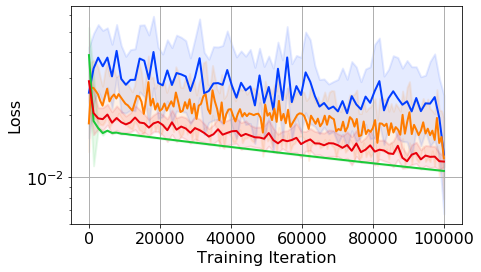

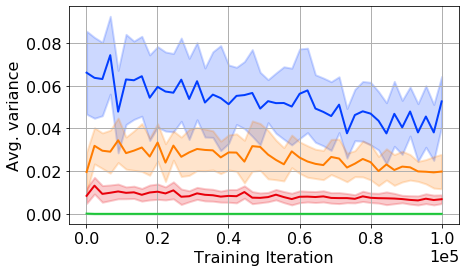

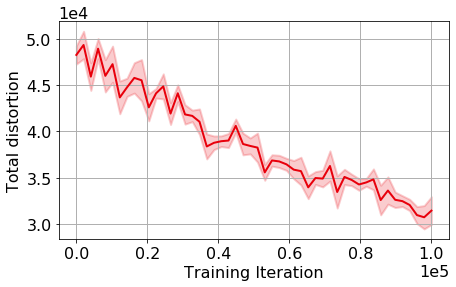

<Figure size 504x288 with 0 Axes>

In [1025]:
get_data_f = get_data_pth
plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10_lr5e-5_snr_10/']  # (?!.*scheduler)
tag_names = ['Tloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/linreg_dim1000_niters1e5_bs10_lr5e-5_snr_10.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, None, None, [0, 1e-1], None]
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
smooth_div_ns = [20, 20, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), ('B=20', '2B'), (',B=10', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

* before this linreg was only noise in the labels, all results were fitting noise

## duplicates

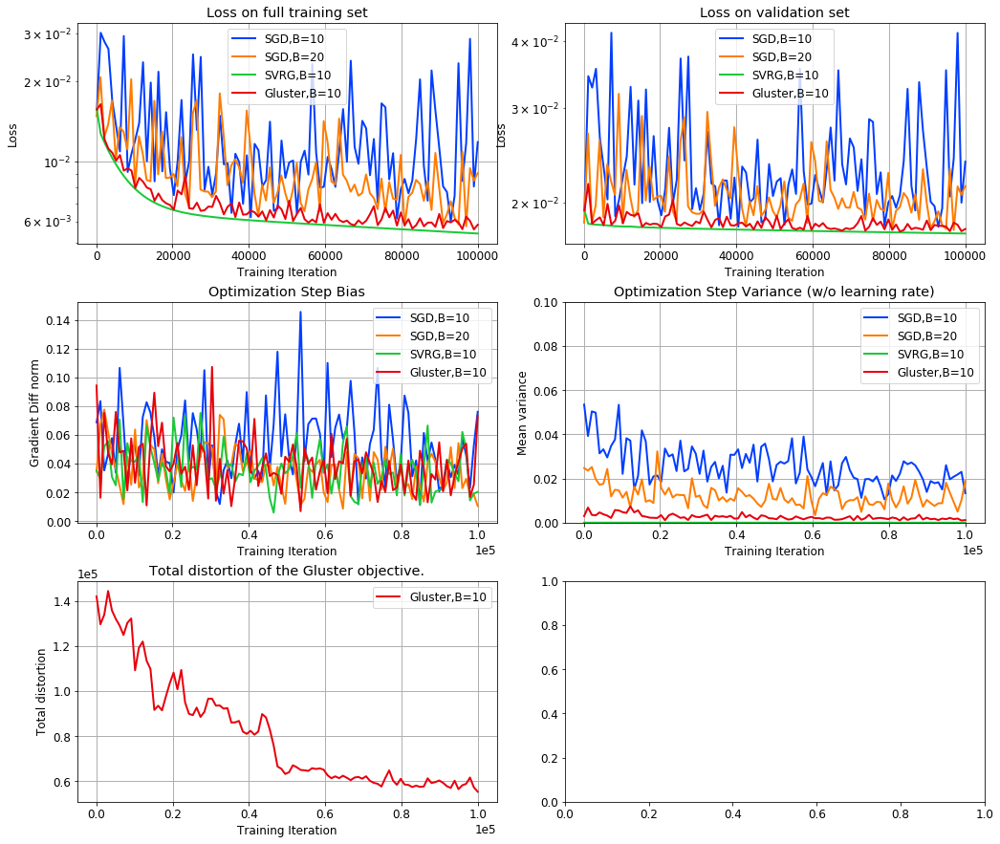

In [471]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10_lr5e-5_snr_10_dup/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var', 'gb_td']
fig_name = 'figs_icml2020/linreg_snr_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, None, None, [0, 1e-1], None]
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

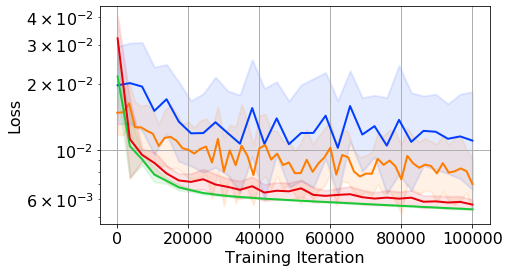

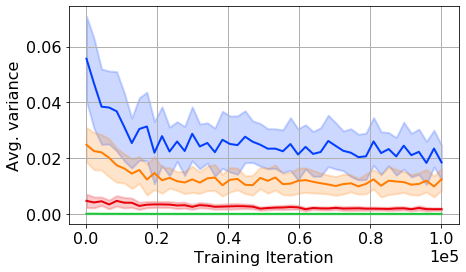

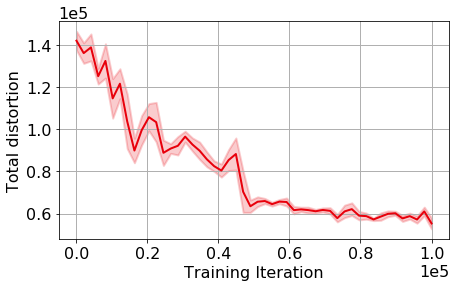

<Figure size 504x288 with 0 Axes>

In [1026]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10_lr5e-5_snr_10_dup/']  # (?!.*scheduler)
tag_names = ['Tloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/linreg_dim1000_niters1e5_bs10_lr5e-5_snr_10_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, None, None, [0, 1e-1], None]
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
smooth_div_ns = [20, 20, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), ('B=20', '2B'), (',B=10', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

* w/wo duplicates, svrg is the best (it's GD bc gradient is constant)
* gluster is the next best, better than 2B
* with duplicates the variance is lower for all, the train loss reachable is lower
* val follows the same trend as expected
* as expected, the train loss is lower bounded by what is achievable by gd
* sgd is flattening, and 2B reaches on average 0.5 of B

# Transformer
- write gluster layer for attention
- write data loader that loads from two streams, uniform and stratified sampled data
- estimate the variance
- compute train loss with uniform sampling
- better to modify transformer-xl code directly without using gvar class

This is too much work while I still don't have full answers on mnist/cifar10

https://github.com/kimiyoung/transformer-xl/tree/master/pytorch

https://github.com/fartashf/dmom_code/tree/transformer/transformer

## linreg duplicates

In [ ]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_dim1000_niters1e5_bs10_lr5e-5_dup/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'grad_bias', 'est_var']
fig_name = 'figs_icml2020/linreg_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 3e-6], None, None, [98, 100], [98, 100]]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B=')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

# mnist

## mlp

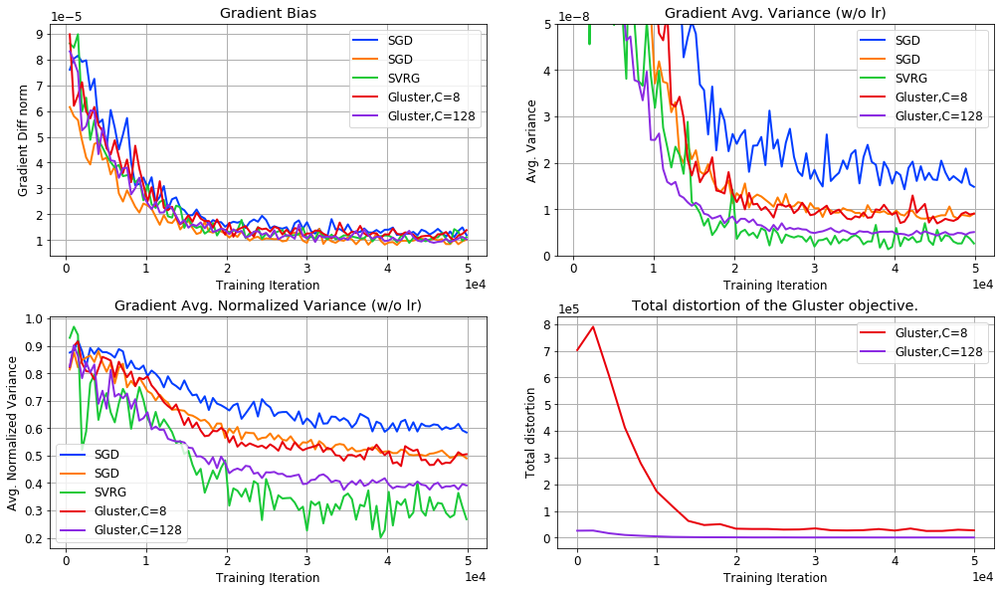

In [1041]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar/.*mlp']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/mnist_mlp.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, [0, 5e-8], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

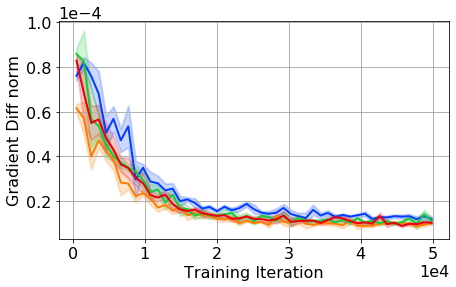

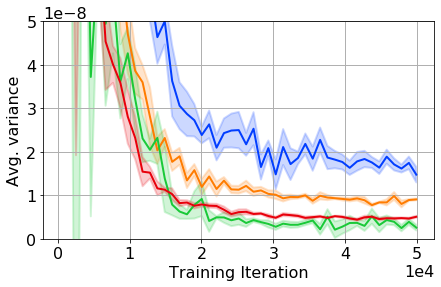

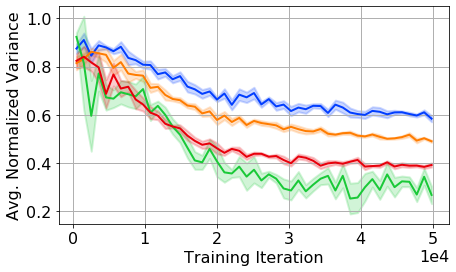

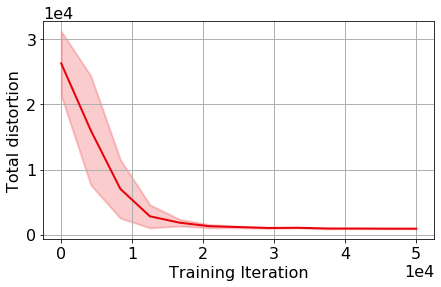

<Figure size 504x288 with 0 Axes>

In [1027]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar/.*mlp(?!.*g_nclusters_8)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_neurips2020/mnist_mlp.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_batch_size']  # g_estim, , 'g_nclusters'
# ylim = [None]*20
ylim = [None, [0, 5e-8], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
smooth_div_ns = [2, 2, 2, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('g_batch_size_', 'B='), (',B=128', ''), (',B=256', ',2B')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

## cnn

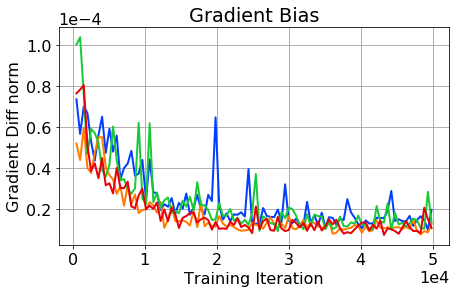

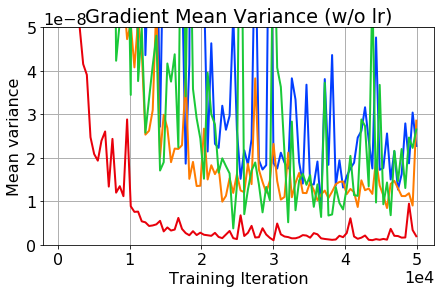

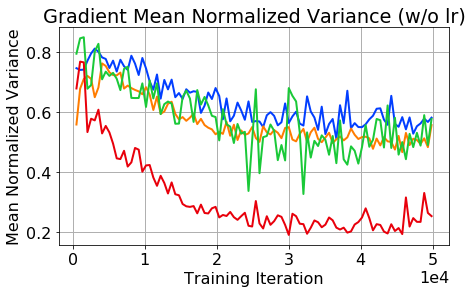

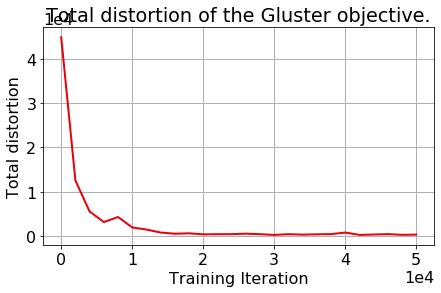

<Figure size 504x288 with 0 Axes>

In [1012]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar/.*cnn(?!.*g_nclusters_8)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/mnist_cnn.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim, , 'g_nclusters'
# ylim = [None]*20
ylim = [None, [0, 5e-8], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

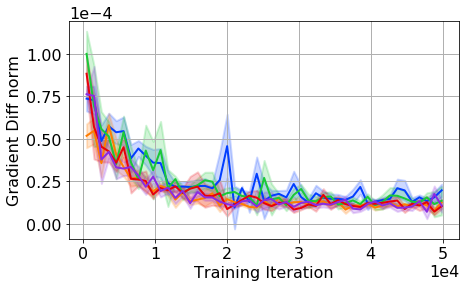

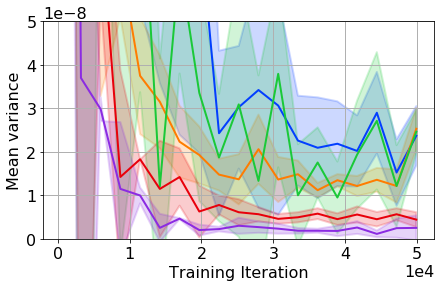

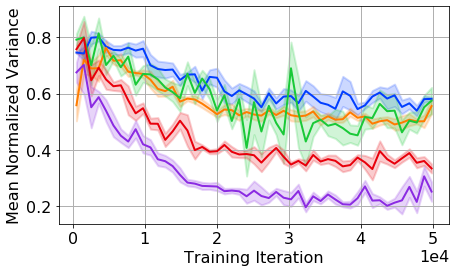

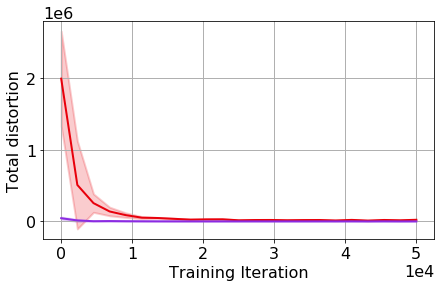

<Figure size 504x288 with 0 Axes>

In [988]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar/.*cnn']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_neurips2020/mnist_cnn.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'g_batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, [0, 5e-8], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
smooth_div_ns = [2, 5, 2, 1.1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('g_batch_size_', 'B='), (',B=128', ''), (',B=256', ',2B')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

based on var
- on mlp svrg better than supersgd, as good as gluster 128
- on cnn, svrg is not good
all is good news

noise model?
- linreg has decreasing gvar and constant ngvar
- but on mnist we have decreasing ngvar and more noise and more fluctuating gvar

# Cifar10

## resnet8

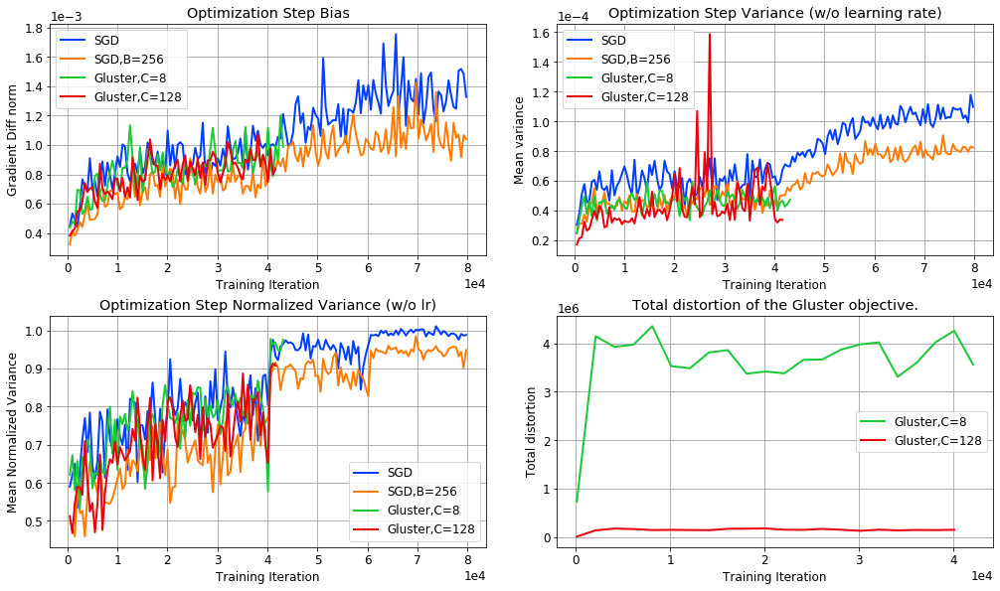

In [87]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar/.*resnet8(?!.*svrg)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

## resnet32

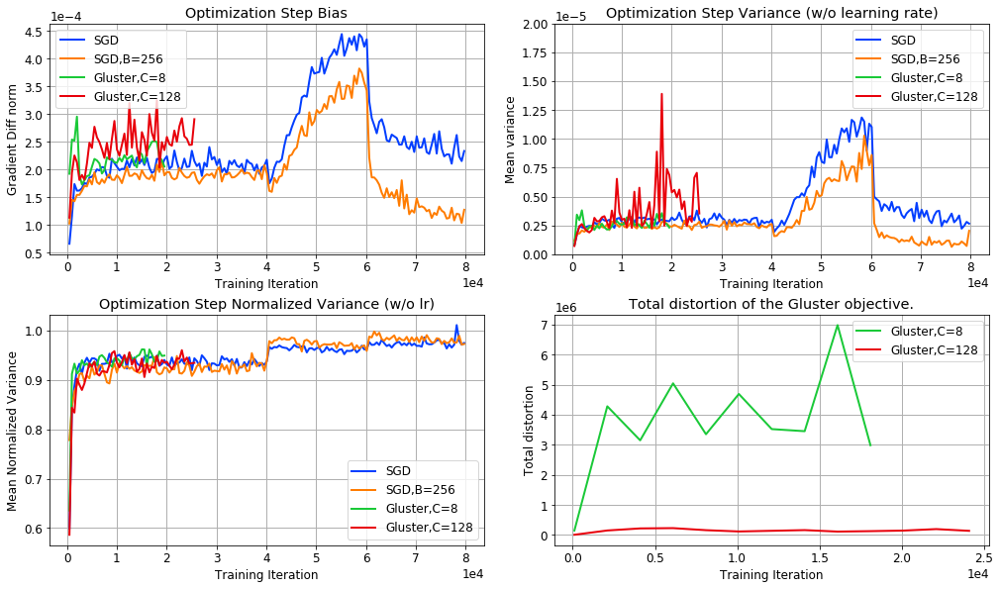

In [80]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar/.*resnet32(?!.*svrg)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

## resnet8 gluster 128 blow up, why?

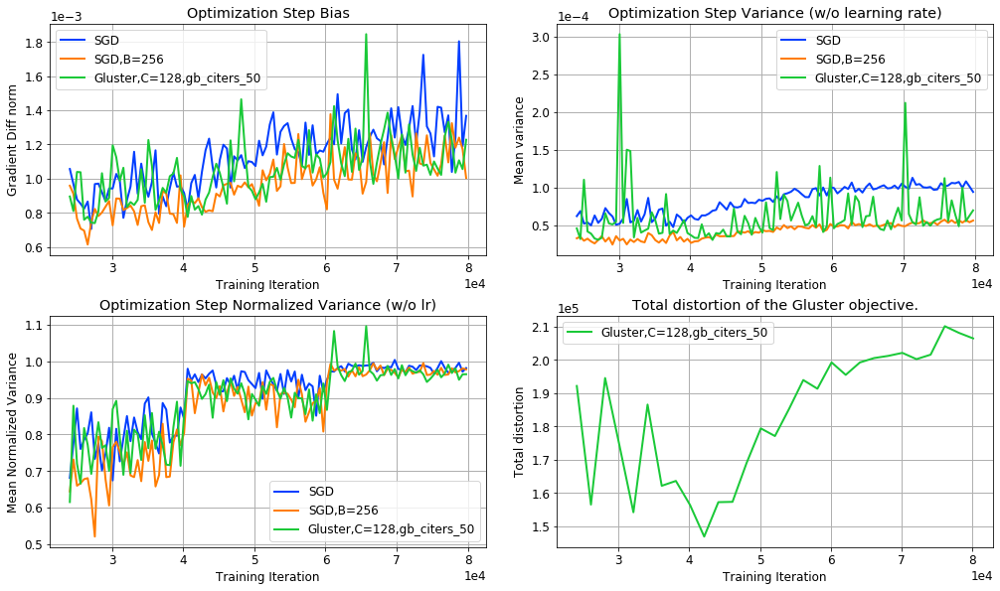

In [109]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8/(.*resnet8(?!.*svrg|.*gluster)|.*citers_50)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'gb_citers']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

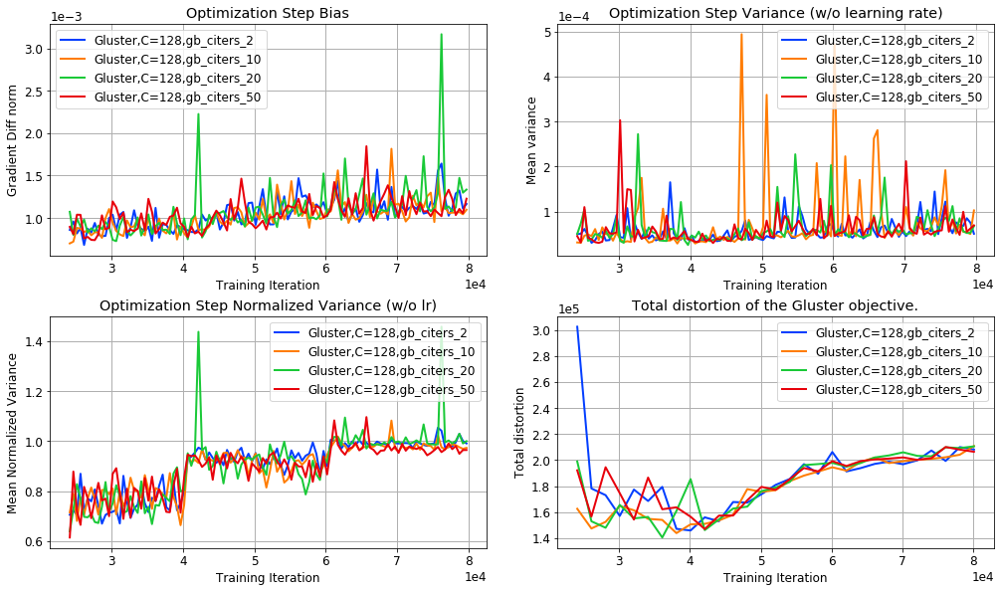

In [107]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8/.*gluster']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'gb_citers']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

- cbiters doesn't solve it
- min size? no, min size is already 1
- maybe not use some clusters?
- use smaller nclusters
- C=8 is more stable

* total distortion seems smooth
* maybe our approximations on the gradient are failing for resnet
* no dropout, no batch norm, what else could be the cause?

## cnn

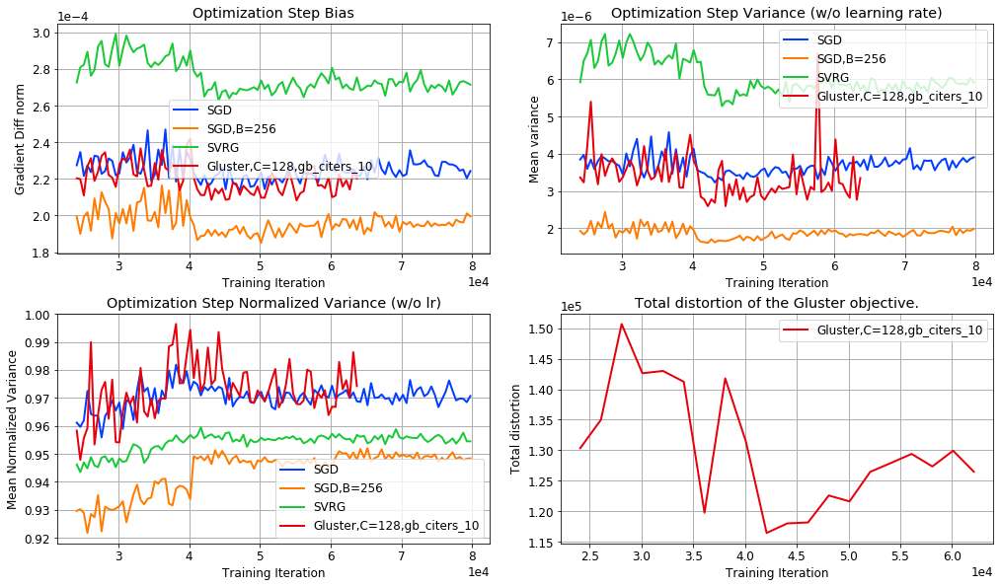

In [128]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_cnn/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_cnn.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'gb_citers']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* if all clusters have the same size, there is no difference between uniform sampling and stratified sampling
* so gluster will be the same as sgd if all clusters are about the same size
* WRONG, only if batch size > # clusters, otherwise the example of 2 points
* basically, no guarantee that gluster will be better than sgd, especially if indep gradients

* we still have the question about unstability, especially in resnet
* it's not that the clustering is wrong, because on average the variance is not high
* it is the instability, which means the clustering needs to be more stable to the changes to model params

ideas:
    * perturb params for cluster
    * use moving average of params

## wnoise

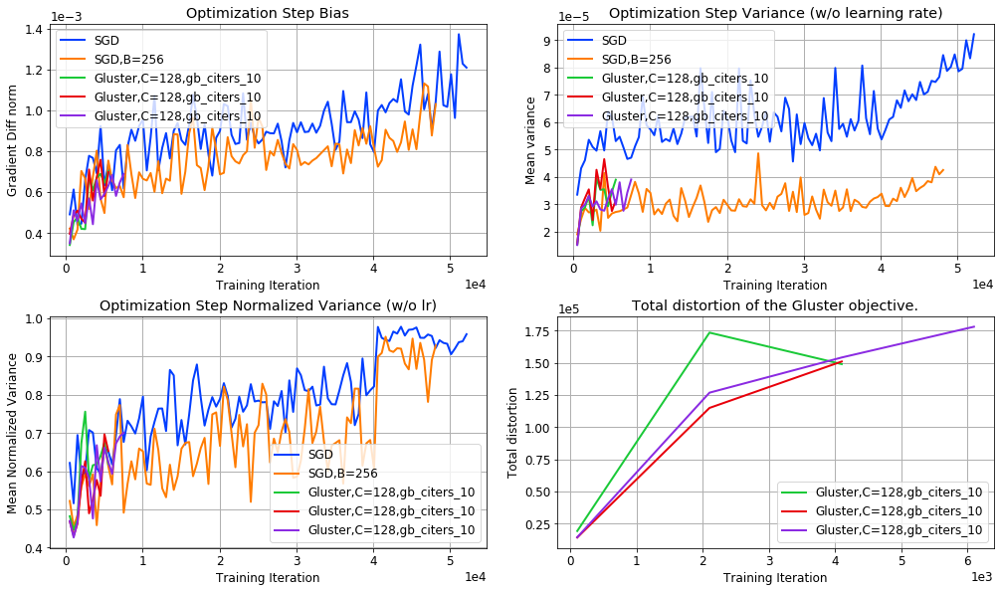

In [136]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_wnoise/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_wnoise.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'gb_citers']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

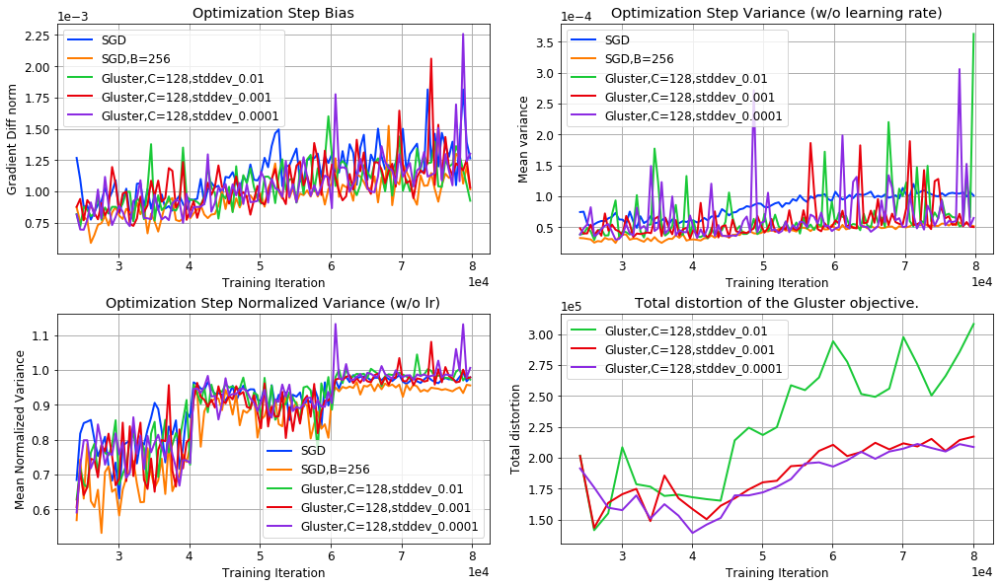

In [150]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_wnoise2/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_wnoise.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'stddev']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

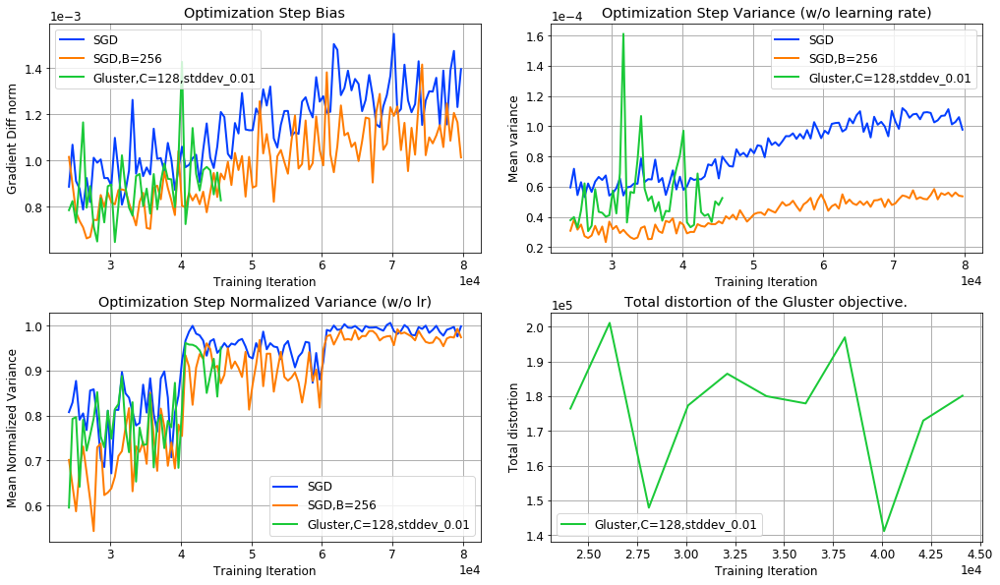

In [178]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_wnoise3/(00|01|.*dev_0.01)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_wnoise.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'stddev']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* simple weight perturb doesn't work
* if model averaging doesn't work, we roughly know the problem in cifar10
* we can move to transformers in the hope that we get a better setting there

## gavg

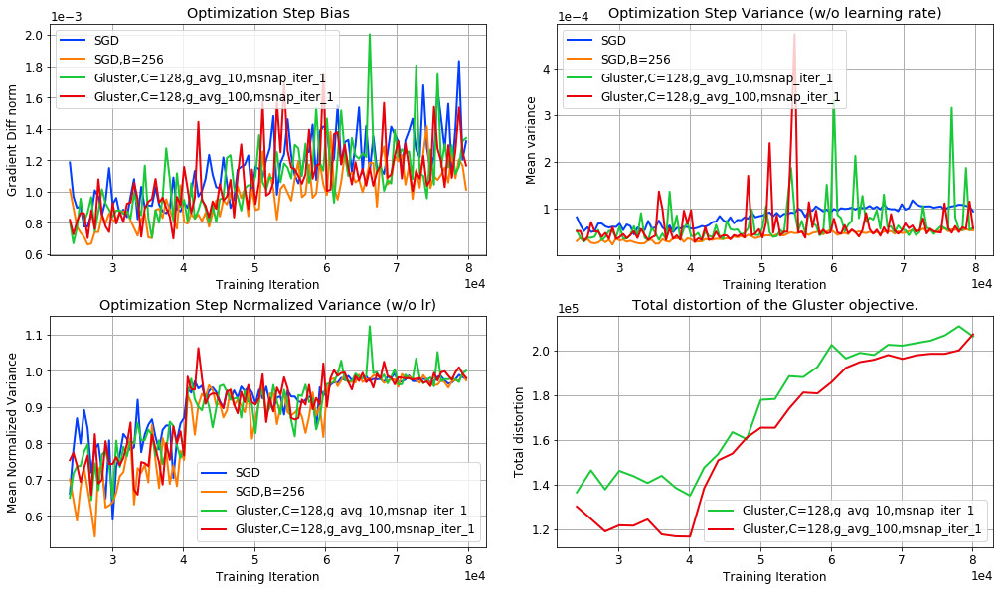

In [173]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_gavg/(00|01|02|04)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_gavg.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* looks like gavg=100, msnap 1 is getting better, so large but recent gavg seems to be good
* larger gavg with msnap=1?

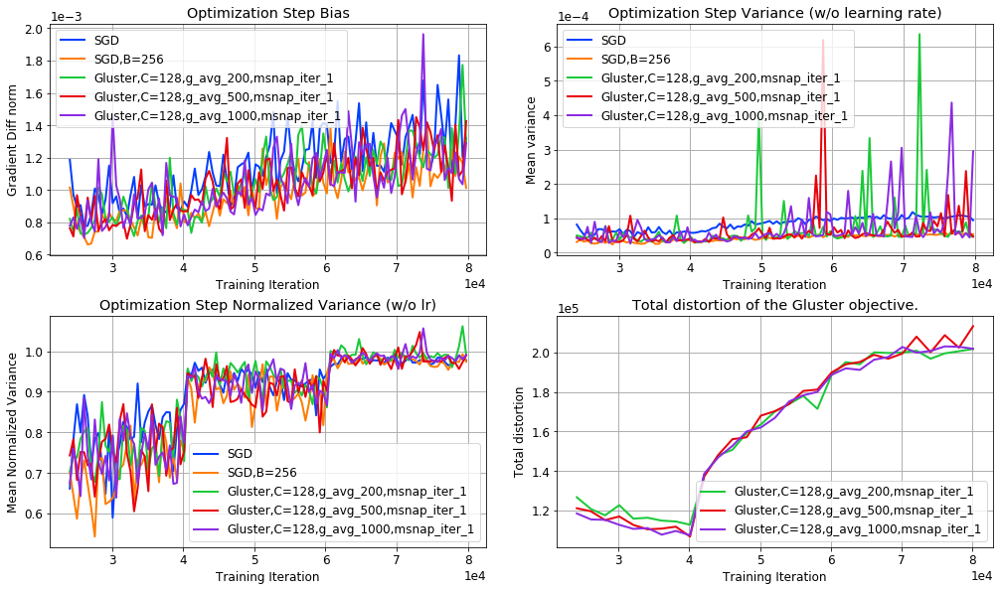

In [170]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_gavg/(00|01|06|07|08)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_gavg.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* gavg is being used but doesn't seem to have too much help, maybe only gavg=100

## gclip, gavg

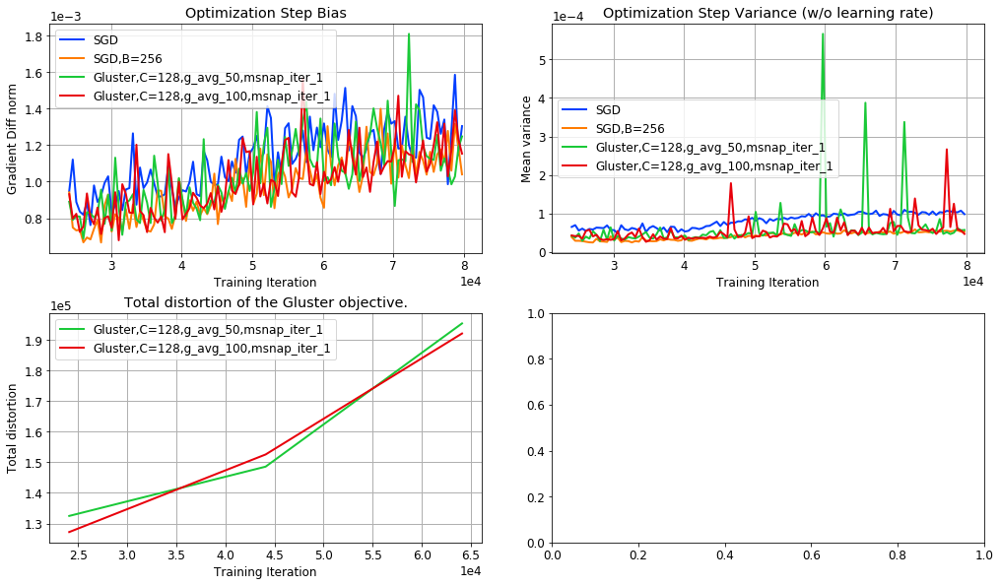

In [184]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_gavg_gclip/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_gavg_gclip.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* any other trick?
* only the variance goes up, it is always unbiased
* explanation: some bad state happens, we cannot prevent it using any trivial tricks
* causes: not batchnorm, not dropout, not model arch, probably only data
* try transformer

* if it is a data problem, do data transformation, see if the behaviour changes
* duplicates in cifar10
* data augmentation
* training subset

## data

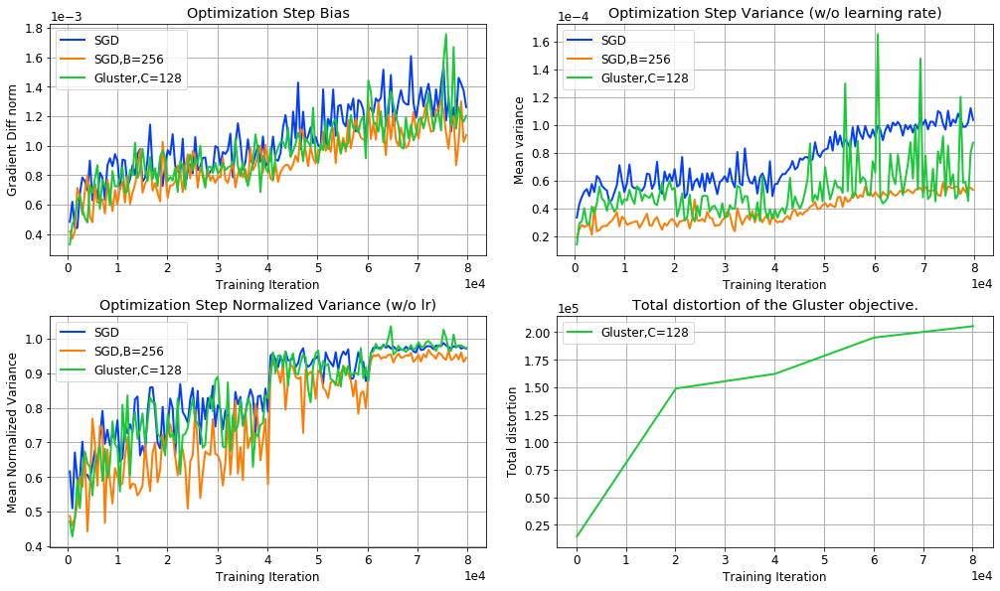

In [209]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*smoothing']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

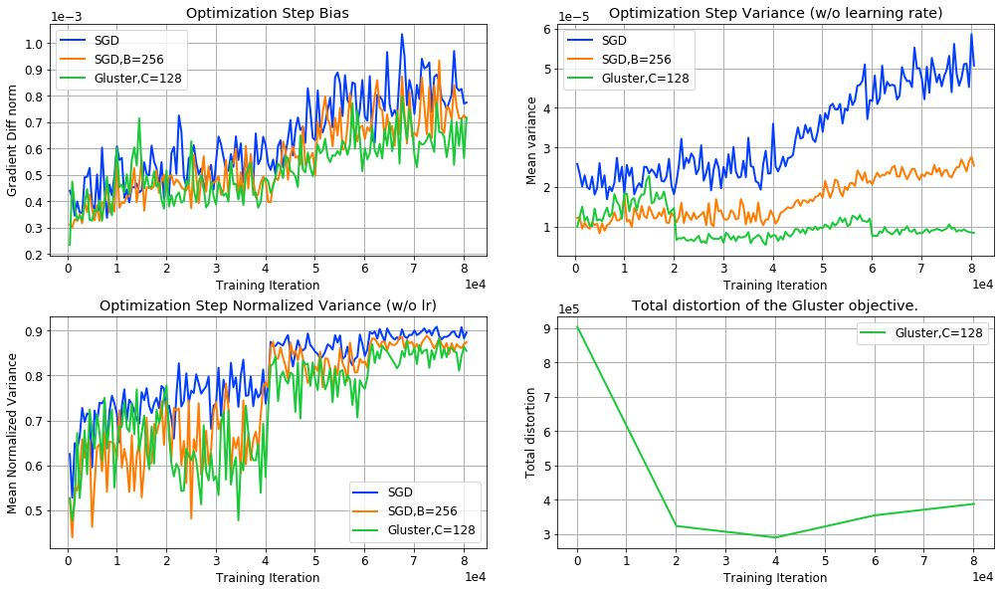

In [210]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*duplicate']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

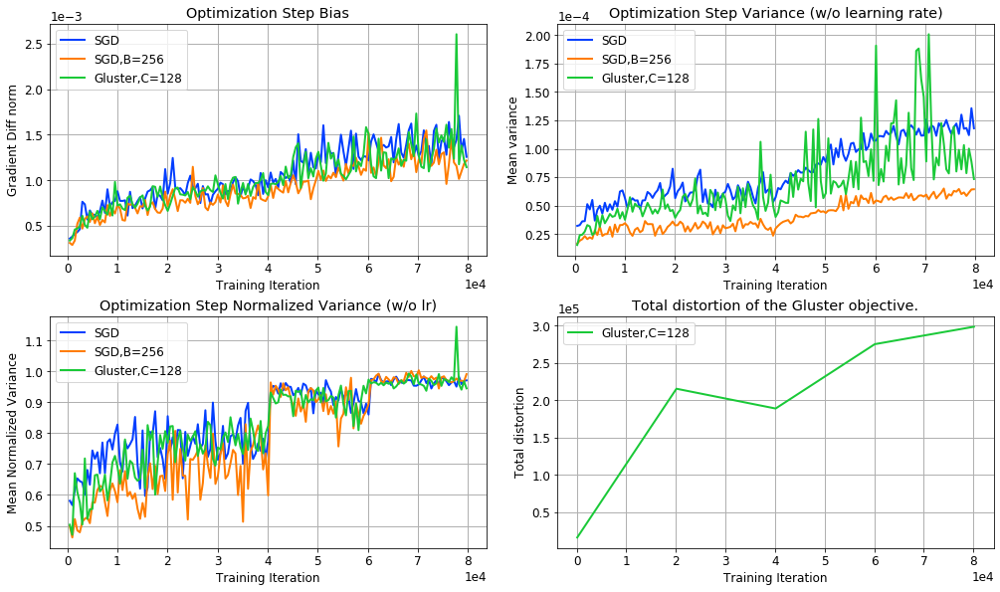

In [211]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*aug']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

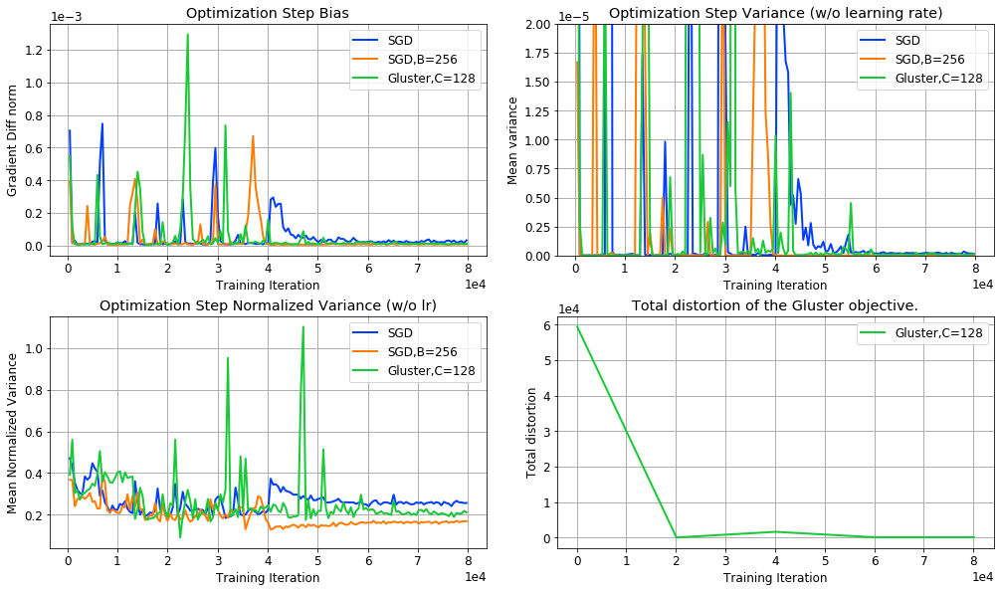

In [212]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*max_train']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
# ylim = [None]*20
ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

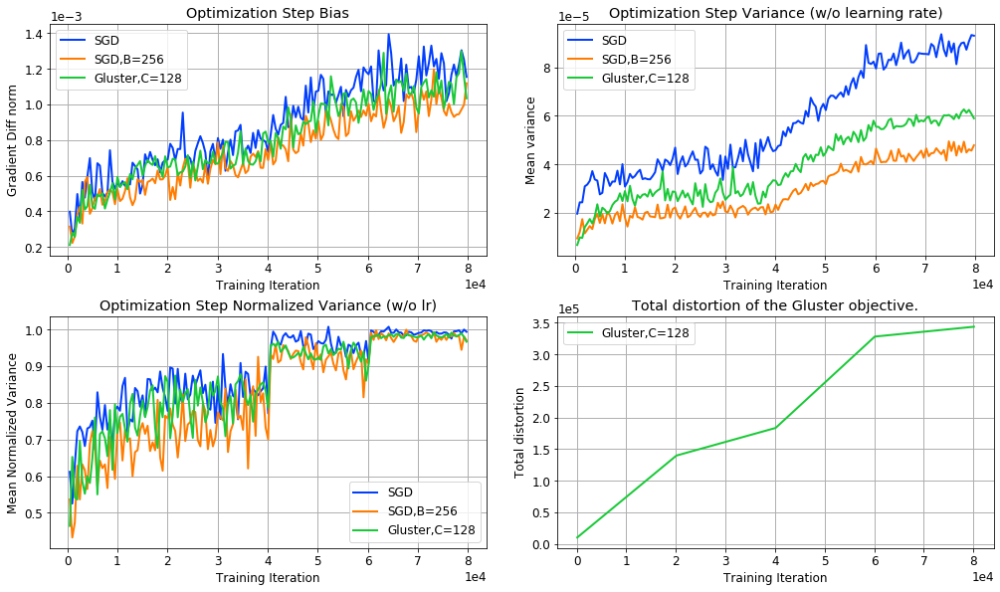

In [213]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*corrupt']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

## example of difference

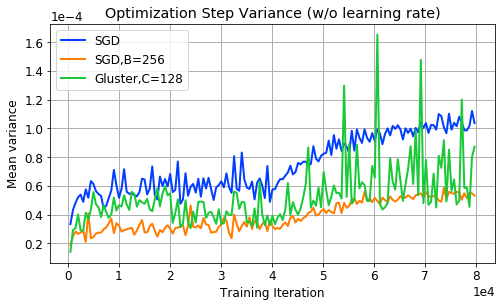

In [480]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*smoothing']  # (?!.*scheduler)
tag_names = ['est_var']
fig_name = 'figs_icml2020/cifar10_resnet8_smoothing.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

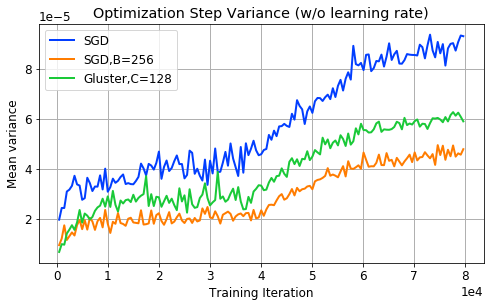

In [481]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*corrupt']  # (?!.*scheduler)
tag_names = ['est_var']
fig_name = 'figs_icml2020/cifar10_resnet8_corrupt.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

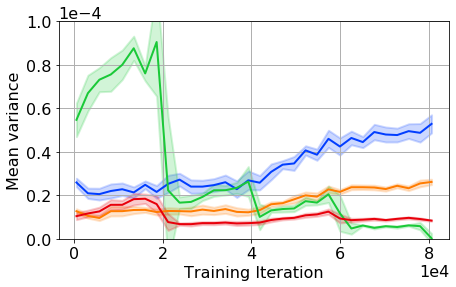

<Figure size 504x288 with 0 Axes>

In [992]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data/.*dup']  # (?!.*scheduler)
tag_names = ['est_var']
fig_name = 'figs_neurips2020/cifar10_resnet8_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
# ylim = [None]*20
ylim = [[0, 1e-4]]
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
smooth_div_ns = [5, 2, 2, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

* it is definitely a data problem


1. label smoothing reduces fluctuations but 0.9 doesn't completely solve it
2. duplicate data is definitely where gluster shines
3. data augmentation also helps but doesn't fully solve
4. max train makes it totally worse
5. corrupt data completely resolves fluctations

* 1, 3, 5: any noisy data helps gluster
* 2, 3, 4: more data is definitely better for both sgd and gluster

hypothesis:
* cifar10 is too small
* there are small noisy data in cifar10 that the model can overfit to, and if the model overfits, gluster provides a bad gradient estimate
* hence any noisy data (label smoothing or corrupt data) dampens that effect
* data augmentation increase the training data and gluster becomes more reliable
* duplicate data is the main example for justifying gluster and it works fine
* small train size is exactly what worsens the fluctuations

Try:
* combinations e.g. label smoothing + corrupt data, label smoothing + data aug
* larger max train set size
* another model (vgg, resnet with batch norm)
* cifar100
* online gluster
* transformer

## other models (resnet32, vgg11)

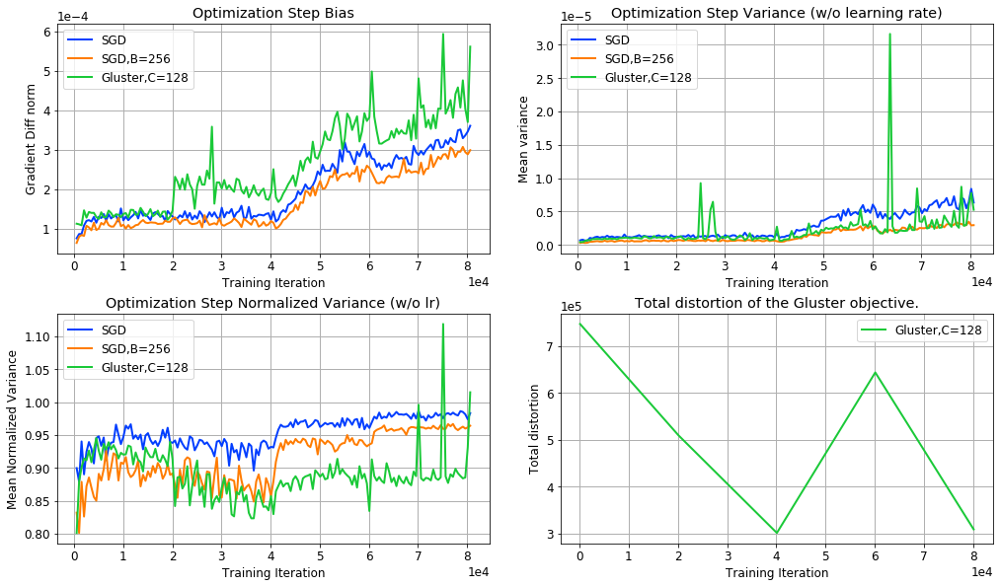

In [215]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_data/.*resnet32.*duplicate']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

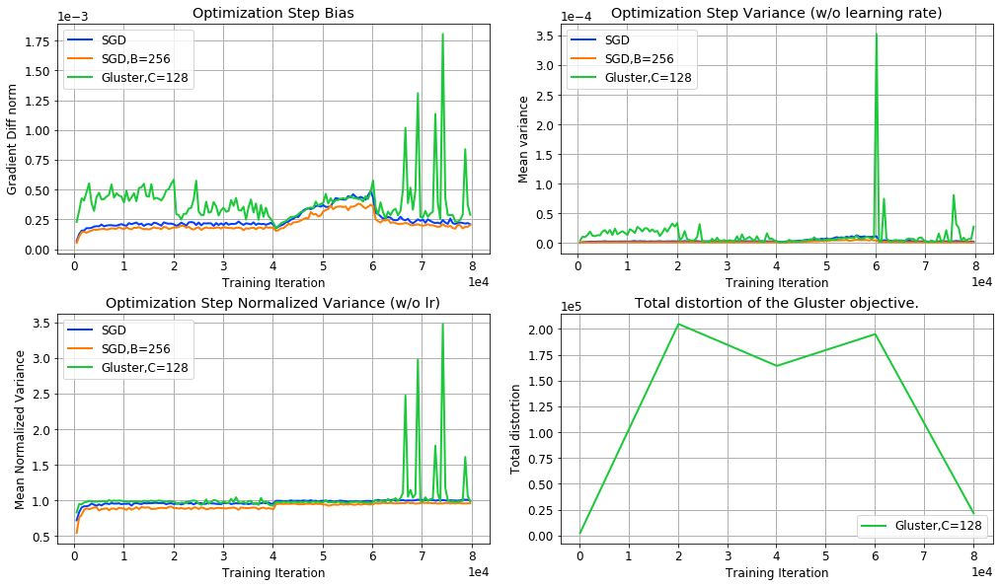

In [216]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_data/.*resnet32.*label_smoothing']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

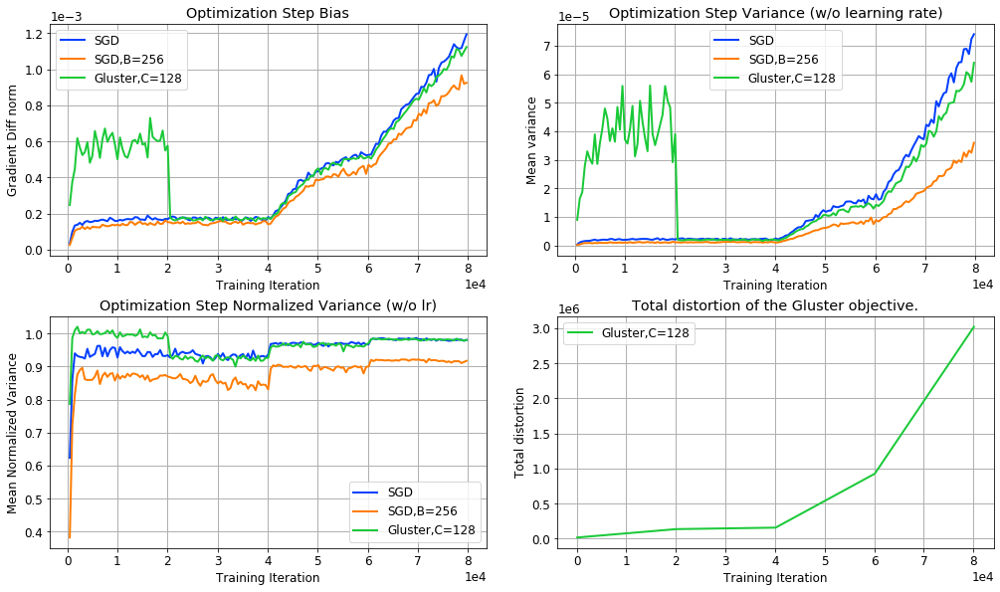

In [224]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_data/.*resnet32.*corrupt']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

## vgg11

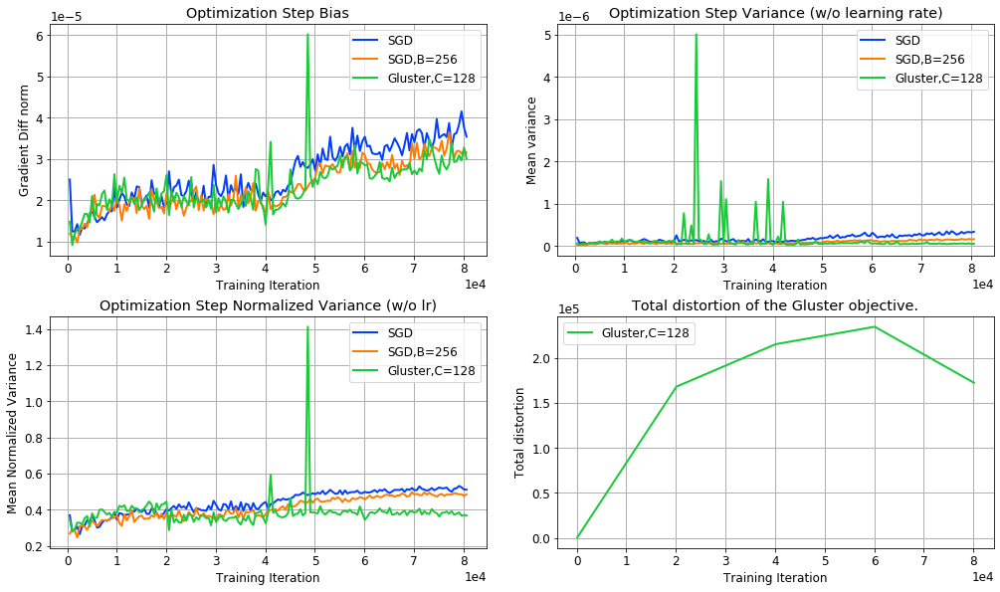

In [225]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_data/.*vgg11.*duplicate']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_vgg11_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

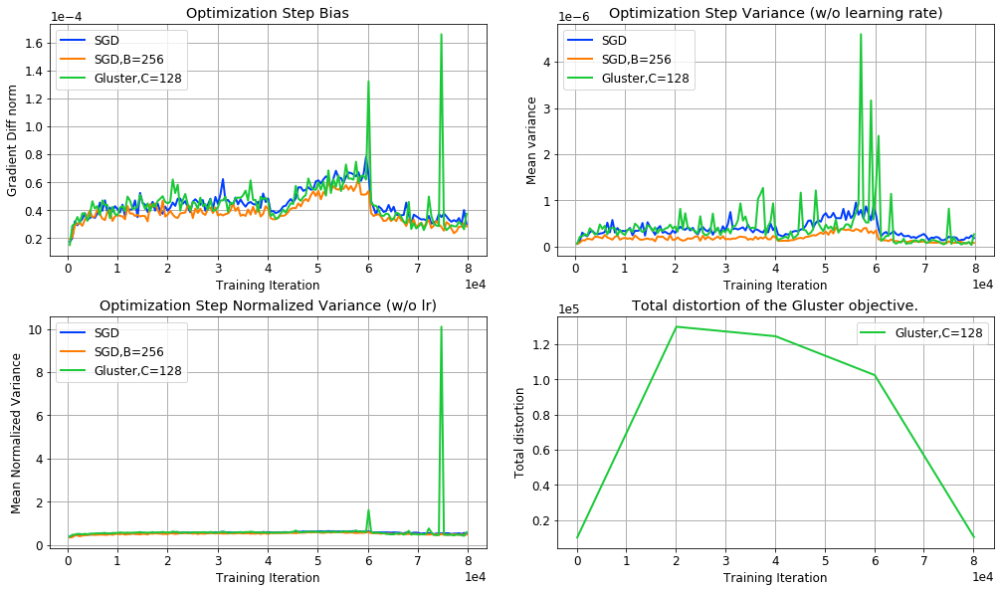

In [226]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_data/.*vgg11.*label_smoothing']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_vgg11_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

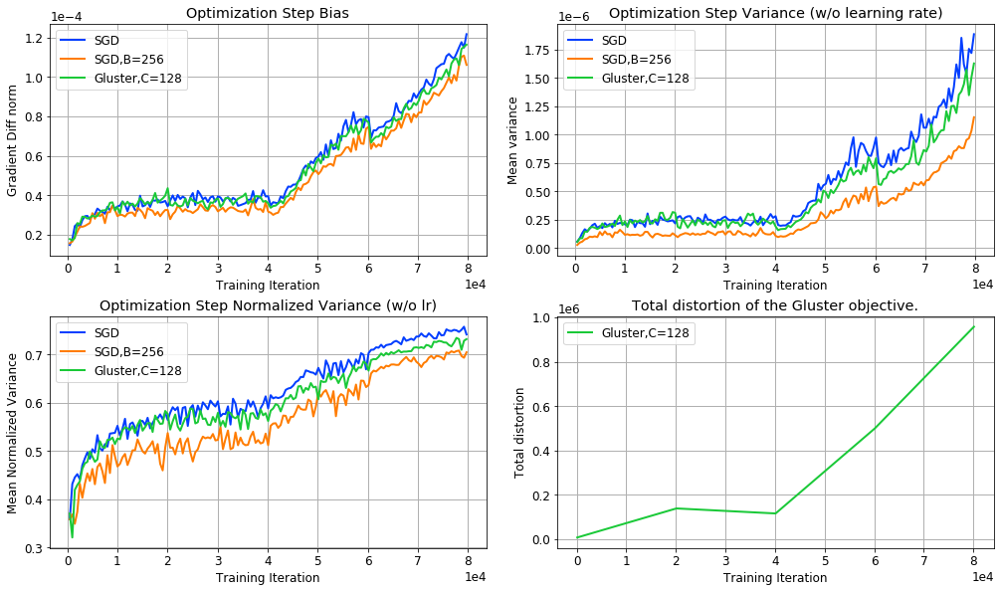

In [227]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_data/.*vgg11.*corrupt']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_vgg11_data.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* corrupt still helps with reduction of fluctuations
* duplicates on average still make the variance of gluster lower, but there is still fluctuation
* label smoothing not at all

Try:
* corrupt + duplicates?
* combinations e.g. label smoothing + corrupt data, label smoothing + data aug
* cifar100
* online gluster
* transformer

questions:
1. how can we fix the fluctation? more data (data_aug), noisy data (label_smoothing, corrupt_data)
2. assume no fluctuation, when does gluster shine? duplicate data

answer:
1. try combinations of data_aug, label_smoothing, corrupt_data
2. try cifar100, imagenet

## Resnet8 product of data aug, label smooth, corrupt

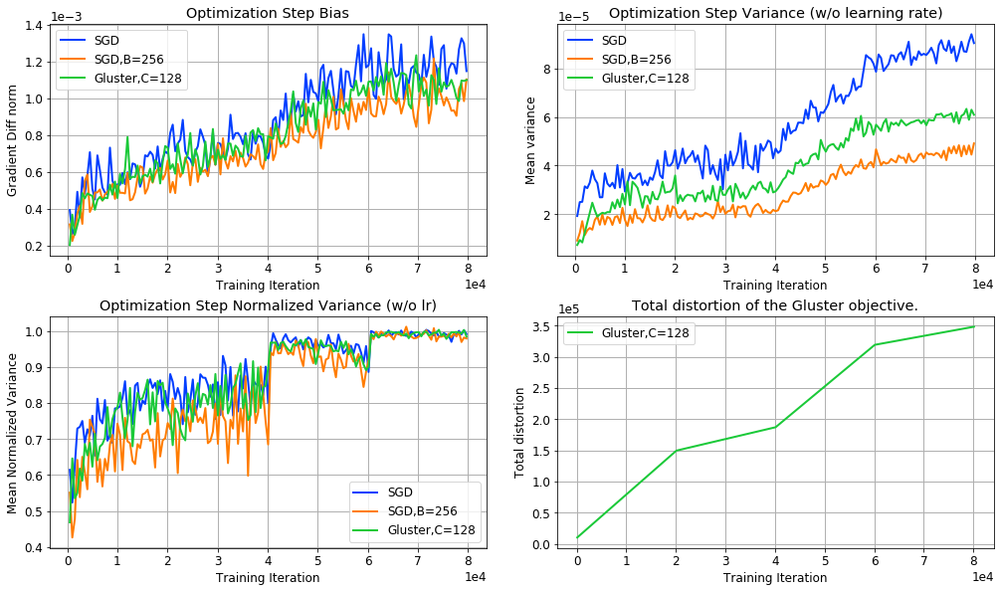

In [236]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing.*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*label_smoothing).*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing(?!.*data_aug).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing.*data_aug(?!.*corrupt)']  # (?!.*scheduler)
patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*label_smoothing)(?!.*data_aug).*corrupt']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data_prod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

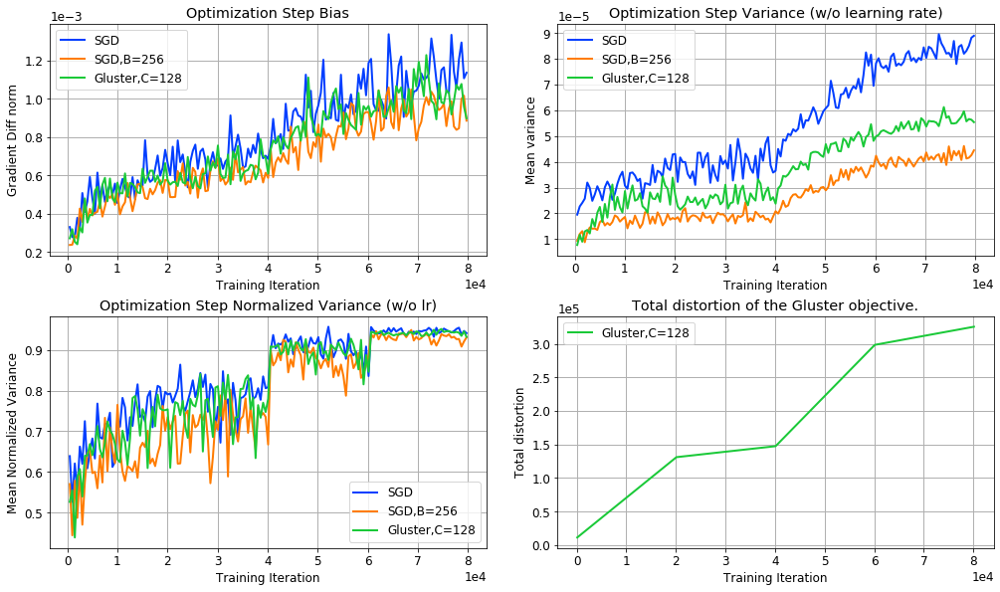

In [237]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing.*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*label_smoothing).*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing(?!.*data_aug).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing.*data_aug(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*label_smoothing)(?!.*data_aug).*corrupt']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data_prod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

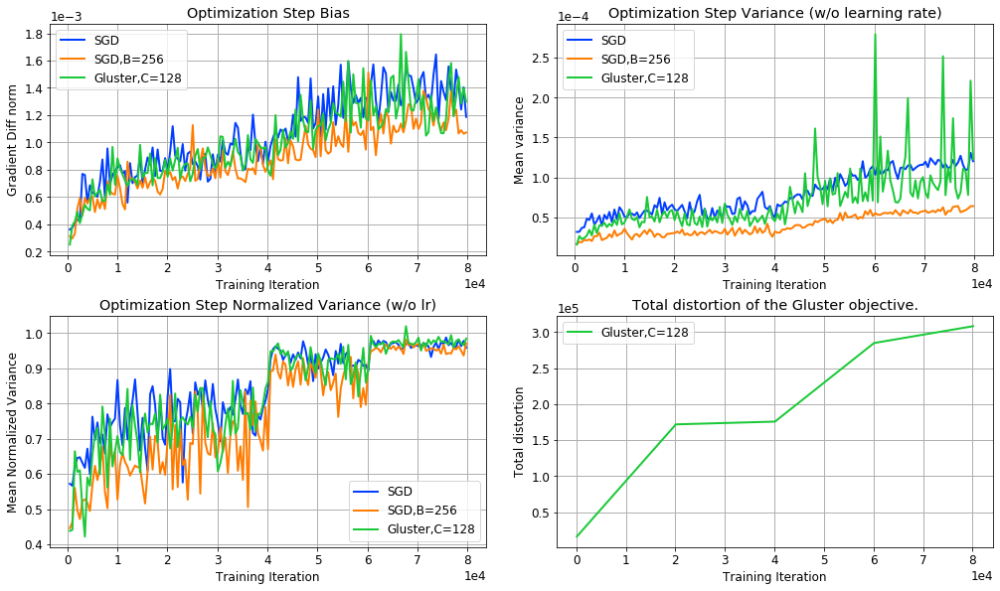

In [238]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing.*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*label_smoothing).*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing(?!.*data_aug).*corrupt']  # (?!.*scheduler)
patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*label_smoothing.*data_aug(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*label_smoothing)(?!.*data_aug).*corrupt']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet8_data_prod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

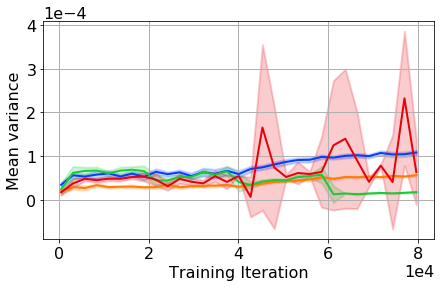

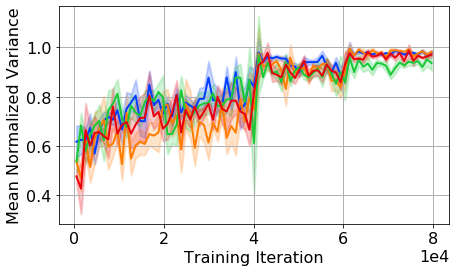

<Figure size 504x288 with 0 Axes>

In [1007]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*smoothing)(?!.*data_aug)(?!.*corrupt)']  # (?!.*scheduler)
tag_names = ['est_var', 'est_nvar']
fig_name = 'figs_neurips2020/cifar10_resnet8_nodataprod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = True
save_single = True
smooth_div_ns = [5, 2, 2, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

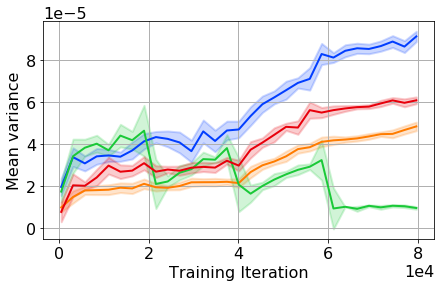

<Figure size 504x288 with 0 Axes>

In [999]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/(?!.*smoothing)(?!.*data_aug).*corrupt']  # (?!.*scheduler)
tag_names = ['est_var']
fig_name = 'figs_neurips2020/cifar10_resnet8_corrupt.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = True
save_single = True
smooth_div_ns = [5, 2, 2, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

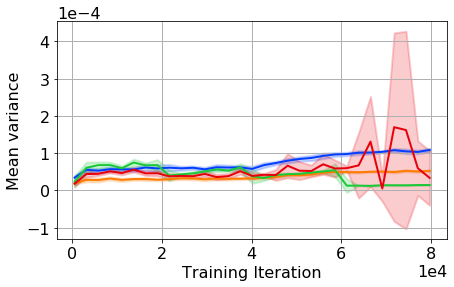

<Figure size 504x288 with 0 Axes>

In [1000]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet8_data_prod/.*smoothing(?!.*data_aug)(?!.*corrupt)']  # (?!.*scheduler)
tag_names = ['est_var']
fig_name = 'figs_neurips2020/cifar10_resnet8_smoothing.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = True
save_single = True
smooth_div_ns = [5, 2, 2, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

* The main thing that fixes the fluctuations is corrupt data
* label smoothing and data_aug have little effect

* try same thing on resnet32 which is the only case where corrupt data does not completely resolve fluctuations

## Resnet32 product of data aug, label smooth, corrupt

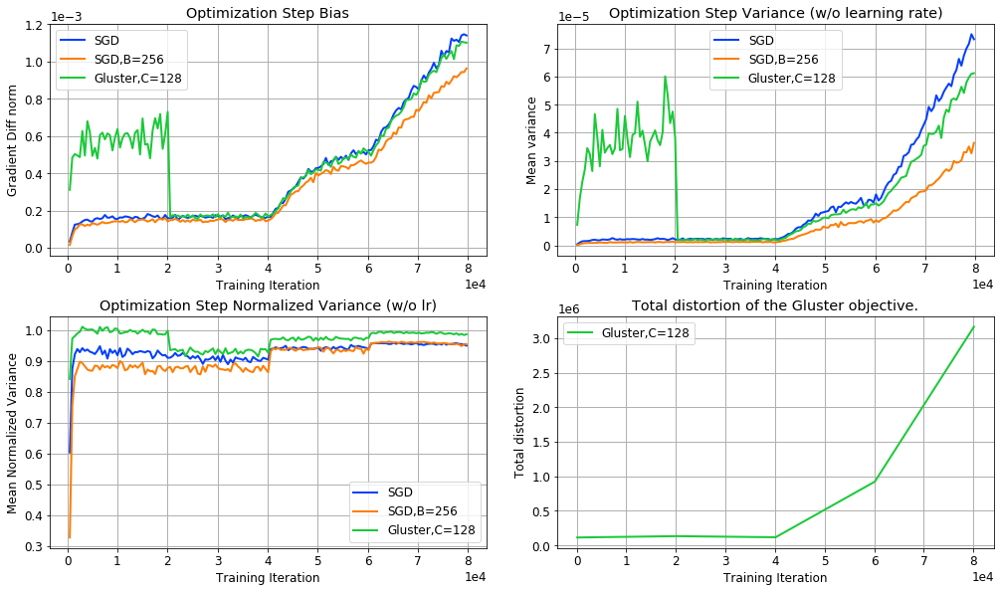

In [273]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing.*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/(?!.*label_smoothing).*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing(?!.*data_aug).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing.*data_aug(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/(?!.*label_smoothing)(?!.*data_aug).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/(?!.*label_smoothing).*data_aug(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing(?!.*data_aug)(?!.*corrupt)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_data_prod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

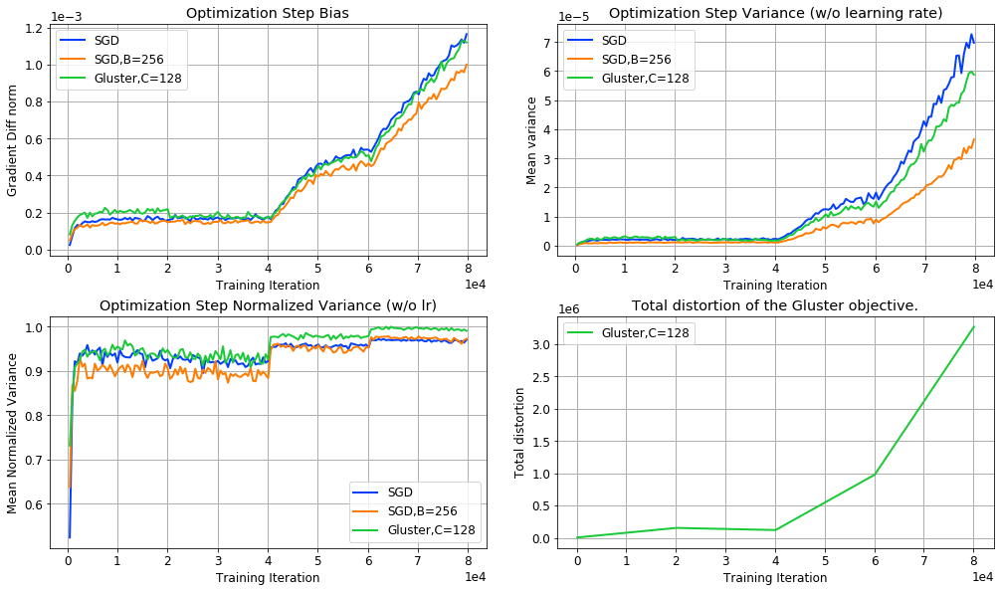

In [274]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing.*data_aug.*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/(?!.*label_smoothing).*data_aug.*corrupt']  # (?!.*scheduler)
patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing(?!.*data_aug).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing.*data_aug(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/(?!.*label_smoothing)(?!.*data_aug).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/(?!.*label_smoothing).*data_aug(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_data_prod/.*label_smoothing(?!.*data_aug)(?!.*corrupt)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_data_prod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* label smoothing/data_aug alone do not fix fluctuation
* corrupt alone lower variance but not at the beginning
* corrupt + label smoothing behaves nicely

questions:
1. how can we fix the fluctation? noisy data (label_smoothing, corrupt_data)
2. assume no fluctuation, when does gluster shine? duplicate data

Try:
* cifar100
* imagenet
* corrupt + duplicates?
* online gluster
* transformer

## Cifar100, Resnet32, label smooth, corrupt

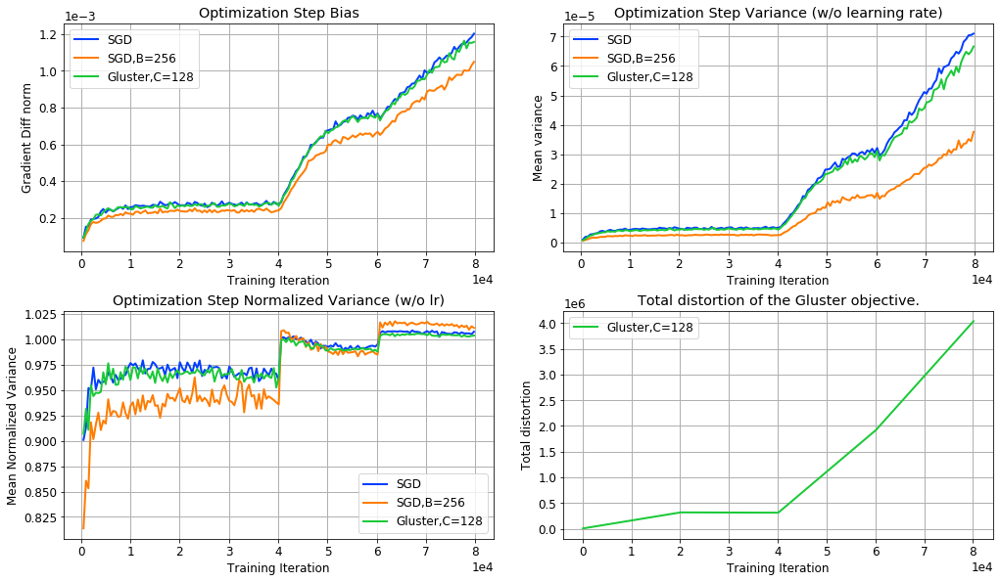

In [299]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar100_gvar_resnet32_data_prod/.*label_smoothing.*corrupt']  # (?!.*scheduler)
patterns = ['.*runs_cifar100_gvar_resnet32_data_prod/(?!.*label_smoothing).*corrupt']  # (?!.*scheduler)
# patterns = ['.*runs_cifar100_gvar_resnet32_data_prod/.*label_smoothing(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar100_gvar_resnet32_data_prod/(?!.*label_smoothing)(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar100_gvar_resnet32_data_prod/(?!.*corrupt)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar100_resnet32_data_prod.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter', 'smoothing_']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 3
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* less fluctuations in general in cifar100
* but the variance reduction is negligible
* label smoothing helps a little bit but not fully with fluctuations, it might be an artifact of single run
* corrupt data makes gluster closer to sgd while making it smoother

questions:
1. how can we fix the fluctation? noisy data (corrupt_data)
2. assume no fluctuation, when does gluster shine? duplicate data

Try:
* corrupt + duplicates on cifar100
* imagenet
* online gluster
* transformer

## cifar100, corrupt + dup

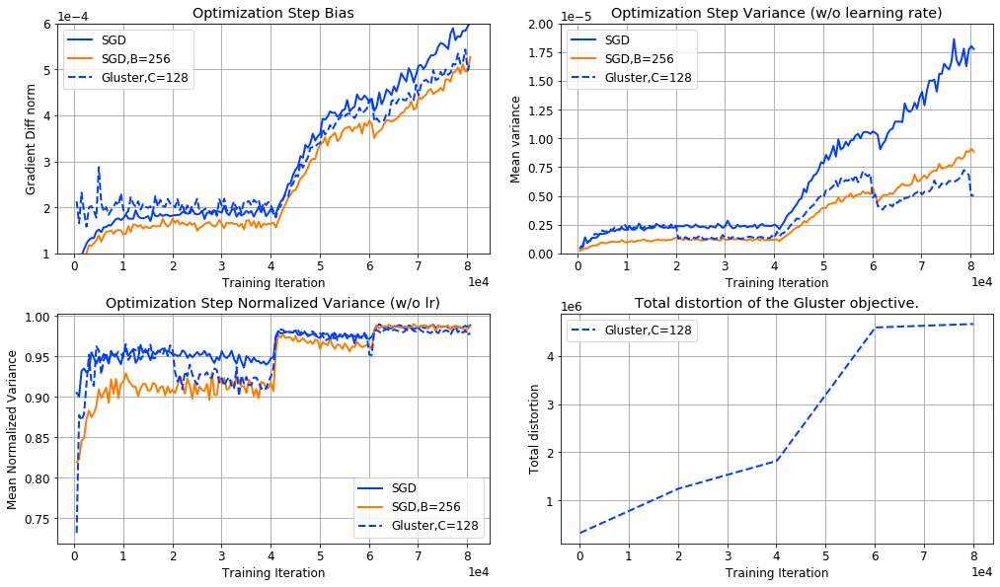

In [316]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar100_gvar_resnet32_corrupt_dup/.*corrupt']  # (?!.*scheduler)
patterns = ['.*runs_cifar100_gvar_resnet32_corrupt_dup/(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar100_gvar_resnet32_corrupt_dup/.*']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar100_resnet32_corrupt_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter', 'perc_']  # g_estim
# ylim = [None]*20
ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 2
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

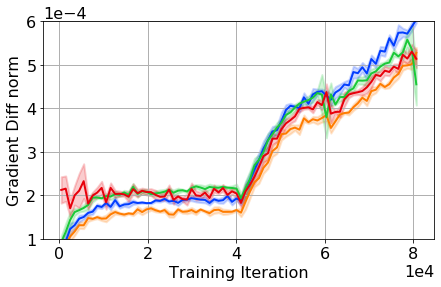

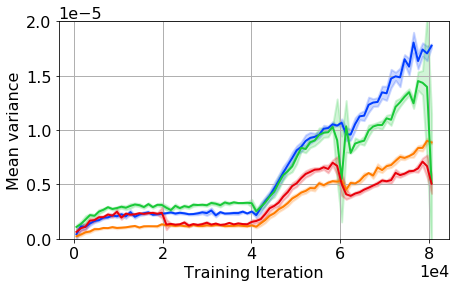

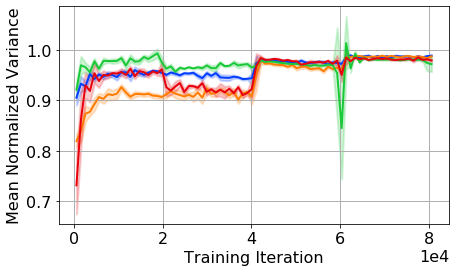

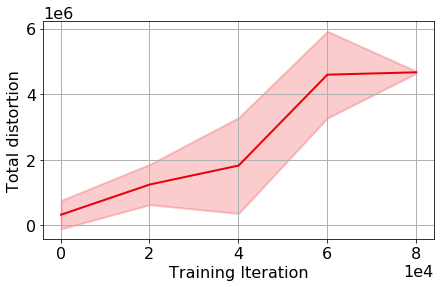

<Figure size 504x288 with 0 Axes>

In [997]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar100_gvar_resnet32_corrupt_dup/.*corrupt']  # (?!.*scheduler)
patterns = ['.*runs_cifar100_gvar_resnet32_corrupt_dup/(?!.*corrupt)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar100_gvar_resnet32_corrupt_dup/.*']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_neurips2020/cifar100_resnet32_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter', 'perc_']  # g_estim
# ylim = [None]*20
ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
smooth_div_ns = [2, 2, 2, 1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

* with duplicate data on cifar100 even clean non-corrupt data is fine, no major fluctuations and by the end the variance is lower than double batch size
* with corrupt data is also fine

Try:
* imagenet
* fashion mnist
* goptim
* rank
* online gluster
* transformer

# imagenet

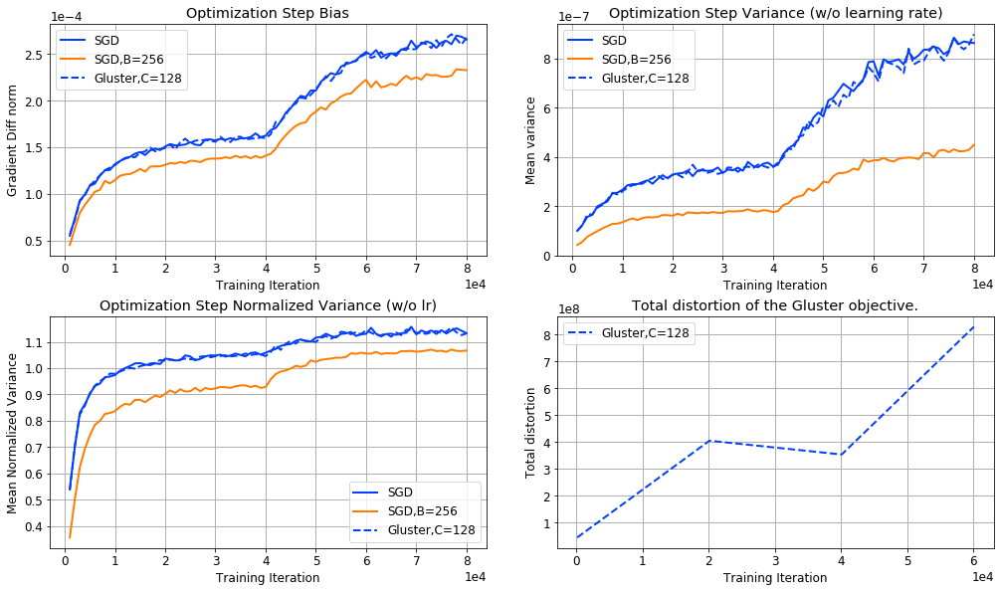

In [323]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_imagenet_gvar/(?!.*corrupt)(?!.*duplicate)']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/.*corrupt(?!.*duplicate)']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/(?!.*corrupt).*duplicate']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/.*corrupt.*duplicate']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/imagenet.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter', 'perc_']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 2
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

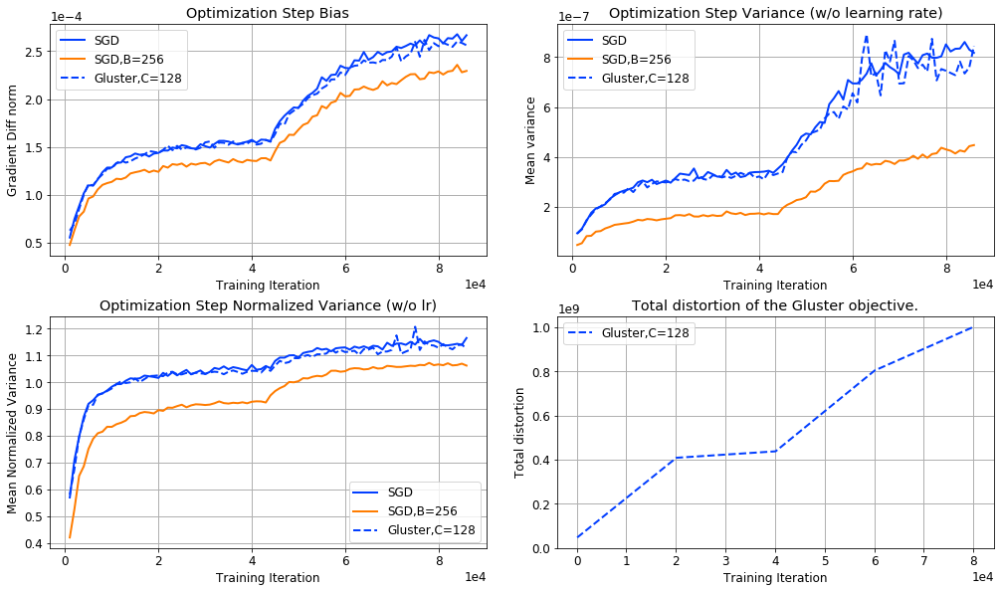

In [328]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_imagenet_gvar/(?!.*corrupt)(?!.*duplicate)']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/.*corrupt(?!.*duplicate)']  # (?!.*scheduler)
patterns = ['.*runs_imagenet_gvar/(?!.*corrupt).*duplicate']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/.*corrupt.*duplicate']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/imagenet.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter', 'perc_']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 2
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

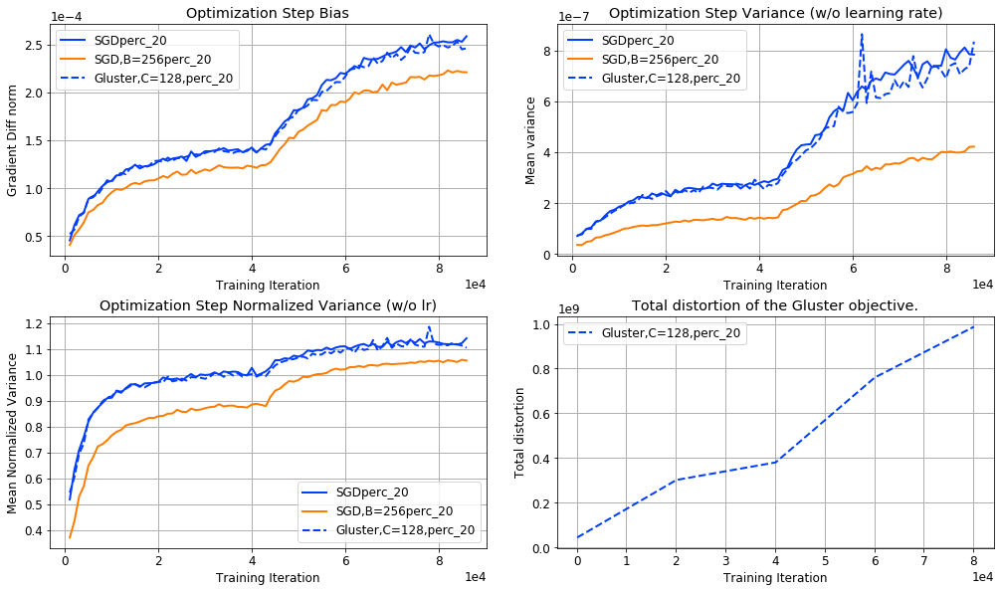

In [335]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_imagenet_gvar/(?!.*corrupt)(?!.*duplicate)']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/.*corrupt(?!.*duplicate)']  # (?!.*scheduler)
# patterns = ['.*runs_imagenet_gvar/(?!.*corrupt).*duplicate']  # (?!.*scheduler)
patterns = ['.*runs_imagenet_gvar/.*corrupt.*duplicate']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/imagenet.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_avg', 'msnap_iter', 'perc_']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 2
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* gluster matches sgd
  - hypothesis: gluster shines when C~=C_true, it is the same as sgd when C<<C_true, bad because of the gradient
  corelation for C>C_true
  - For C>B, think of multiple steps of GD at the same time, if gradient of clusters are uncorrelated, then
  SGD+gluster can be thought of as a large minibtach SGD that is doing coordinate descent in each step.
  - if C<<C_true, does it provide anything better than uniform sampling?
* no fluctuations without corrupt and duplicate
* +duplicate is gaining some variance reduction at the end but a bit of fluctuations as well
* corrupt+duplicate failed with out of range distortions
* cbiters was 3

try:
* imagenet
    - larger batch size
    - C>>B
    - cbiters > 3
    - bsnap_iter > 20000
* fashion mnist
* goptim
* rank
* online gluster
* transformer

## imagenet large batch

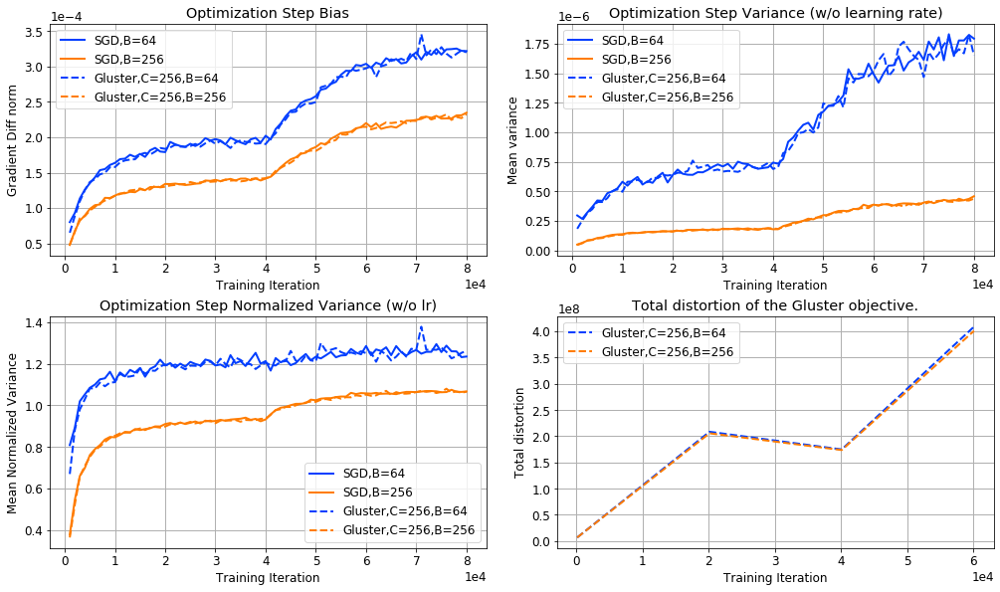

In [336]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_imagenet_gvar_large_batch/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/imagenet_large_batch.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 2
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* large batch size: gluster on large batch size is the same as sgd, no var reduction
* C >> B: still no var reduction

try:
* plot vs C, mnist, imagenet, cifar10, compare with duplicates
* underparam imagenet model
* imagenet
    - cbiters > 3
    - bsnap_iter < 20000
* fashion mnist
* goptim
* rank
* online gluster
* transformer

run when ftime is done

## imagnet kahan sum

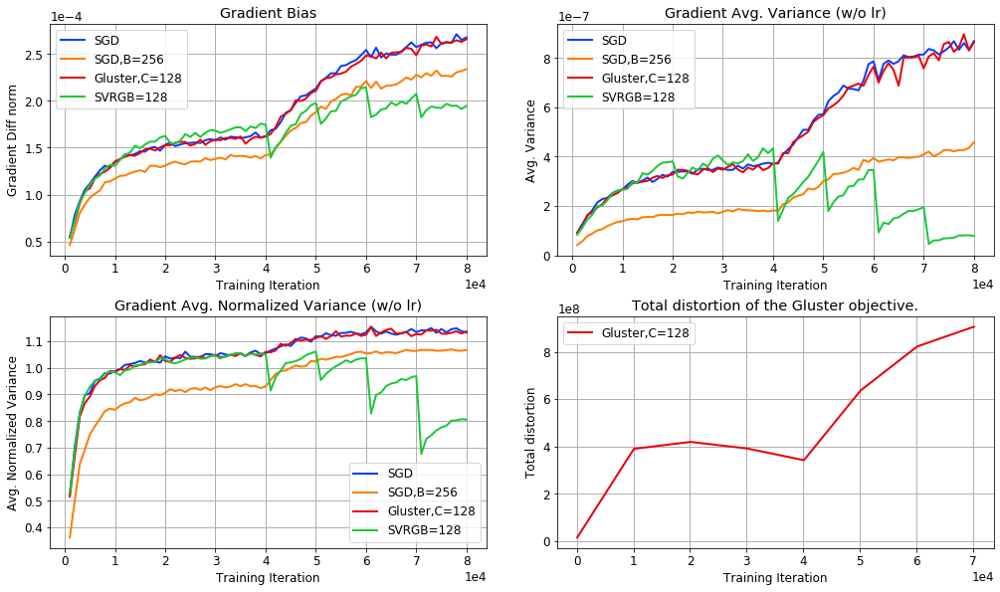

In [1031]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_imagenet_gvar_kahan/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/imagenet_kahan.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = [0, 1, 3, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

save fig

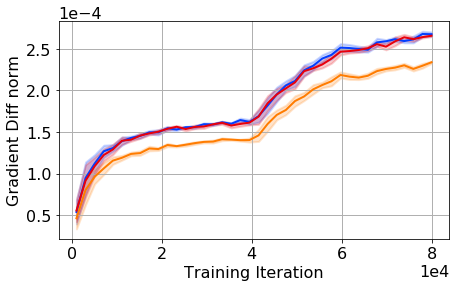

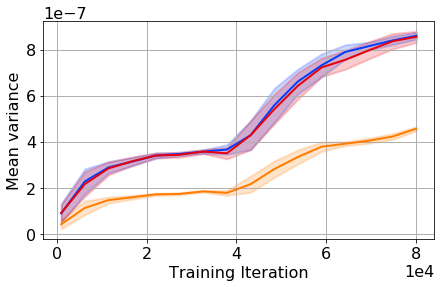

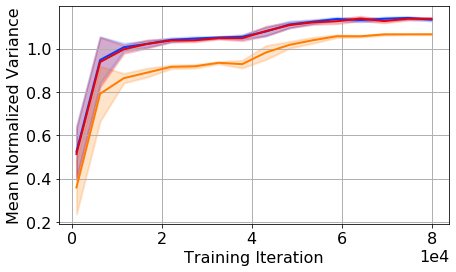

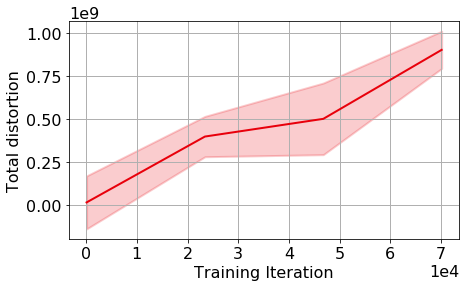

<Figure size 504x288 with 0 Axes>

In [1024]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_imagenet_gvar_kahan/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_neurips2020/imagenet_kahan.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size']  # g_estim, 'g_nclusters', 
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = [0, 1, 3]
smooth_div_ns = [2, 5, 5, 2]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

* even though plots vs C suggest that gluster should be better than sgd B we don't see that here
* plots vs C were only at the beginning of the training.
* total distortion is above 1e8. that's a big number and the change from one gluster iter to next is 1e7.

TODO:
* plot vs C after 1e4 steps
* clustering with fewer data points

- Noisy Quadratic Model (linear regression with noise in the labels): Gluster with batch size B has lower variance than SGD with 2B mini-batch size.
- CIFAR-10: the variance of Gluster estimator had spikes. I have studied this in detail and the results suggest that it is a data problem limited to CIFAR-10. And if I add a specific type of noise to the data, Gluster becomes stable.
- CIFAR-100 and Imagnet: the variance of Gluster estimator is lower than SGD with the same mini-batch size but not lower than 2B mini-batch.
- Extra duplicates added to NQM, MNIST, CIFAR-10, CIFAR-100. Gluster shines truly in this case. The variance of Gluster estimator is lower than SGD with 2B mini-batch size. This supports our original intuition behind Gluster.

- The variance on Imagenet is stable but the same as SGD with the same mini-batch size.
- I can prove that for a fixed memory footprint, our rank-1 formulation achieves the lowest clustering objective possible compared to any rank-k formulation.

# plot vs C

# mnist

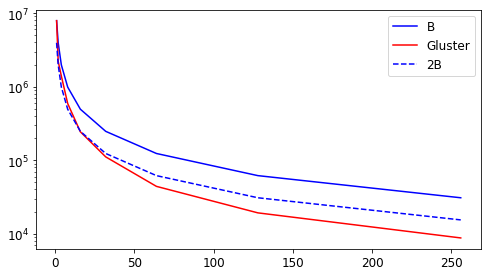

In [396]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*mnist']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/mnist_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()
td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

# cifar10

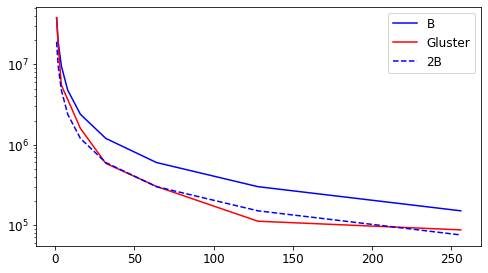

In [400]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*cifar10(?!.*duplicate)']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/cifar10_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()
td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

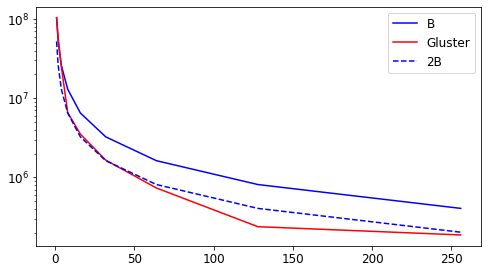

In [398]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*cifar10(.*duplicate)']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/cifar10_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()
td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

# imagenet

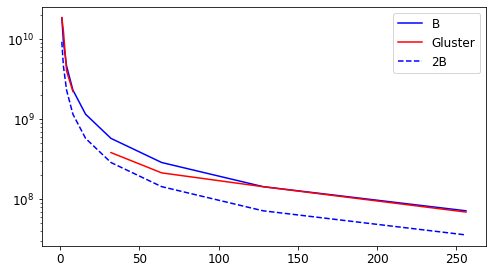

In [416]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*imagenet(?!.*kahan)']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/cifar10_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()
td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

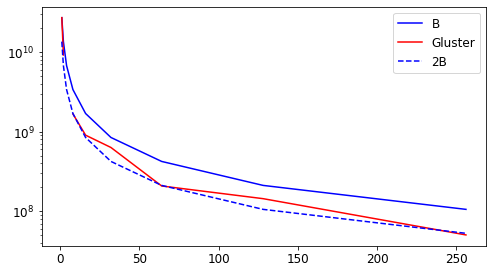

In [428]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*imagenet(.*kahan)']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/cifar10_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()

td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

imagenet
* kahan sum helps in imagenet, the curves now overlap with 1/C

TODO:
- do uniform and mixture of gaussians
- nans in imagenet, C=4, kahan sum

# random input

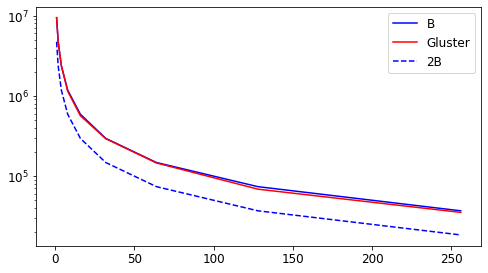

In [437]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters_randi/']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/mnist_nclusters_randi.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()
td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

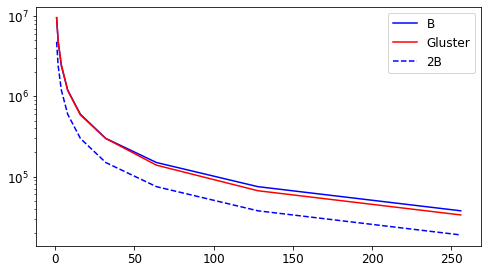

In [445]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters_randi_normal/']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_icml2020/mnist_nclusters_randi.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

plt.clf()
td = [data[i]['gb_td'][1] for i in range(len(data))]
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='B', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label='2B', c='b', ls='--')
ax = plt.gca()
ax.set_yscale('log')
plt.legend()

save fig

mnist

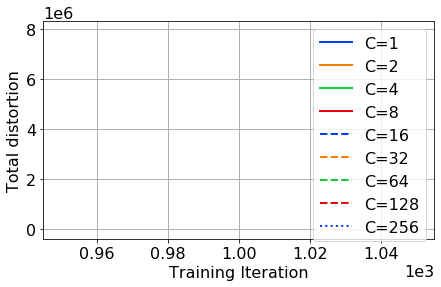

<Figure size 504x288 with 0 Axes>

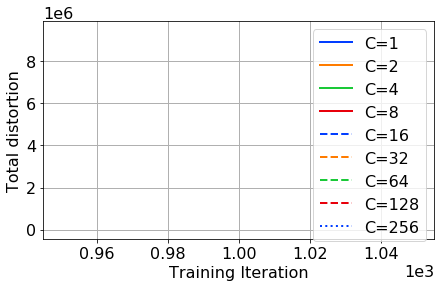

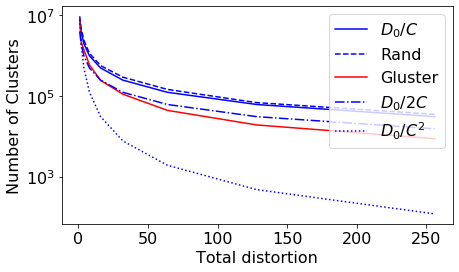

In [850]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*mnist']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_neurips2020/mnist_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
sep_h = True
ncolor = 4
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)
td = [data[i]['gb_td'][1] for i in range(len(data))]
plt.clf()

patterns = ['.*runs_nclusters_randi/']  # (?!.*scheduler)
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)
td_rand = [data[i]['gb_td'][1] for i in range(len(data))]




plt.clf()
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='$D_0/C$', c='b')
plt.plot(nclusters, td_rand, label='Rand', c='b', ls='--')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label=r'$D_0/2C$', c='b', ls='-.')
plt.plot(nclusters, td[0]/(nclusters**2), label=r'$D_0/C^2$', c='b', ls=':')
plt.xlabel('Total distortion')
plt.ylabel('Number of Clusters')
ax = plt.gca()
ax.set_yscale('log')
plt.savefig('figs_plotc/mnist_nolegend.pdf', dpi=100, bbox_inches='tight')
plt.legend()
plt.savefig('figs_plotc/mnist.pdf', dpi=100, bbox_inches='tight')

cifar10

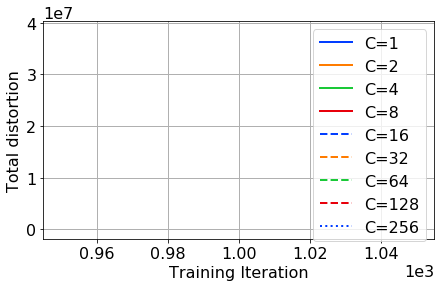

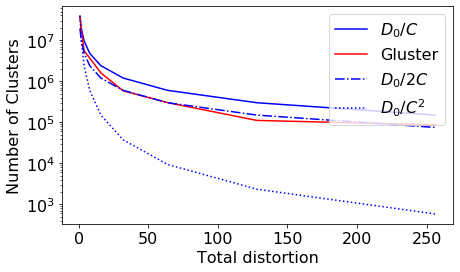

In [849]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*cifar10(?!.*duplicate)']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_neurips2020/cifar10_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
sep_h = True
ncolor = 4
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)
td = [data[i]['gb_td'][1] for i in range(len(data))]



plt.clf()
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='$D_0/C$', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label=r'$D_0/2C$', c='b', ls='-.')
plt.plot(nclusters, td[0]/(nclusters**2), label=r'$D_0/C^2$', c='b', ls=':')
plt.xlabel('Total distortion')
plt.ylabel('Number of Clusters')
ax = plt.gca()
ax.set_yscale('log')
plt.savefig('figs_plotc/cifar10_nolegend.pdf', dpi=100, bbox_inches='tight')
plt.legend()
plt.savefig('figs_plotc/cifar10.pdf', dpi=100, bbox_inches='tight')

imagenet

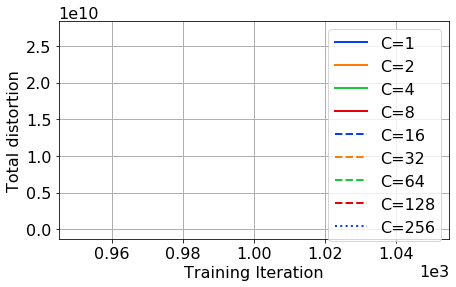

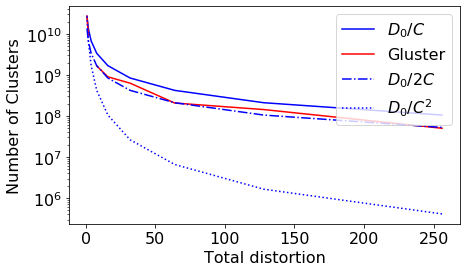

In [848]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_nclusters/.*imagenet(.*kahan)']  # (?!.*scheduler)
tag_names = ['gb_td']
fig_name = 'figs_neurips2020/imagenet_nclusters.png'
lg_tags = ['g_nclusters', 'duplicate']  # g_estim
ylim = [None]*20
sep_h = True
ncolor = 4
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)
td = [data[i]['gb_td'][1] for i in range(len(data))]



plt.clf()
nclusters = np.power(2, np.arange(len(data)))
plt.plot(nclusters, td[0]/nclusters, label='$D_0/C$', c='b')
plt.plot(nclusters, td, label='Gluster', c='r')
plt.plot(nclusters, td[0]/(2*nclusters), label=r'$D_0/2C$', c='b', ls='-.')
plt.plot(nclusters, td[0]/(nclusters**2), label=r'$D_0/C^2$', c='b', ls=':')
plt.xlabel('Total distortion')
plt.ylabel('Number of Clusters')
ax = plt.gca()
ax.set_yscale('log')
plt.savefig('figs_plotc/imagenet_nolegend.pdf', dpi=100, bbox_inches='tight')
plt.legend()
plt.savefig('figs_plotc/imagenet.pdf', dpi=100, bbox_inches='tight')

Me (March 25):
- Results on Noisy Quadratic Model (linear regression with noise in the labels) are in favor of Gluster.
- The issue on CIFAR10 where the Gluster estimator had high variance can be resolved by adding noise to the data. It seems to be a data problem that doesn't appear as strongly on CIFAR-100 and Imagenet. But very specific types of noise can fix that.
- Gluster shines with extra duplicates added to NQM, MNIST, CIFAR-10, CIFAR-100. The variance is lower than SGD with double the mini-batch size.
- On Imagenet, the gradients do not form clusters, hence no improvement on uniform sampling. For this part, I have a new plot that measures the performance of clustering and how it compares to uniform sampling.
- I have the sketch of a proof that for a fixed memory footprint, our rank-1 formulation achieves the lowest clustering objective possible compared to any rank-k formulation.

David (March 27):

issue of noise
2 plots were nice
why up then immediately back down
adding noise variance for all goes up

adding noise is a diagnostic: not solution
what about redo? spikes are transient
outlier cluster: gets scattered, so they were together once, can happen if few points in a cluster
or outlier points: should have happened with sgd too
mean grad == weighted mean of cluster centers
within cluster variances over time

1) being unlucky by the samples
2) all clusters having a little bit of extra variance
3) just a few having a lot
k curves

cluster averaging and mean is the max likelihood estimate
some metric to either detect them or down weight them


biased vs unbiased, imbalanced/outliers

Tuesday, Thursayd, friday afternoon

# CIFAR10 fluctuation investigation, individual cluster variance

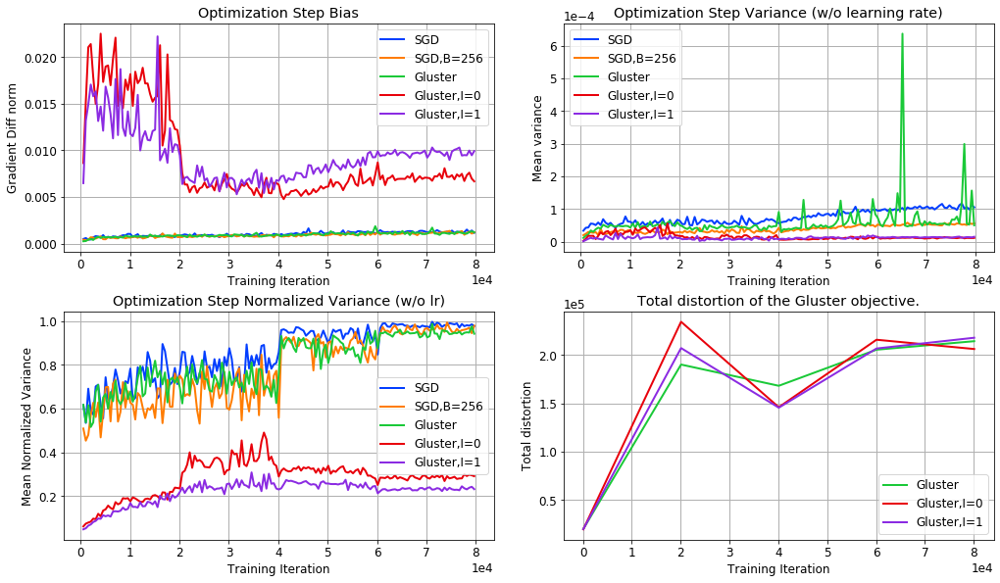

In [516]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_incluster/(00|01|02|03|04)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_incluster_gvar.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster']  # g_estim, 'g_nclusters', 
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('g_incluster_', 'I='), ('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

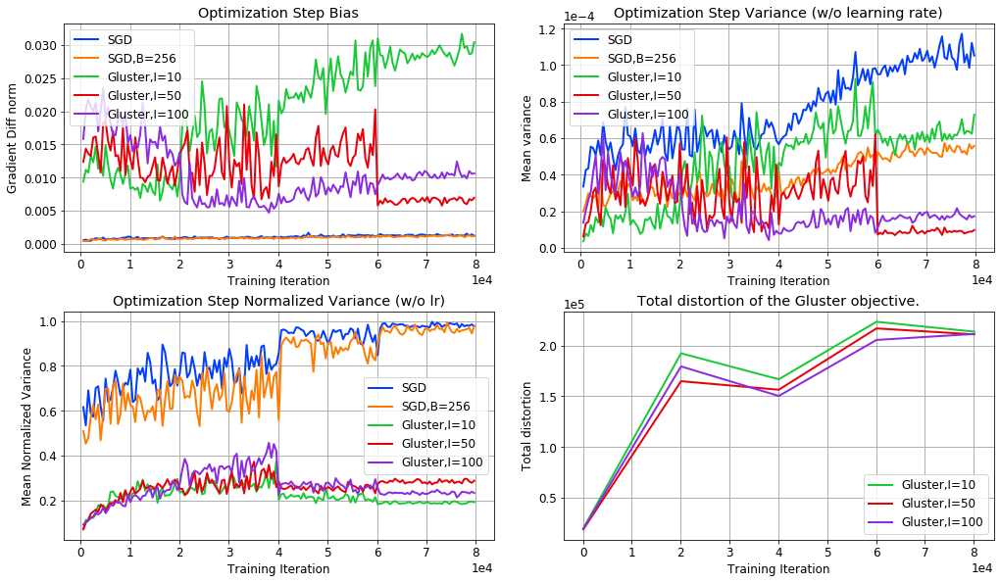

In [517]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_incluster/(00|01|05|06|07)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_incluster_gvar.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster']  # g_estim, 'g_nclusters', 
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('g_incluster_', 'I='), ('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

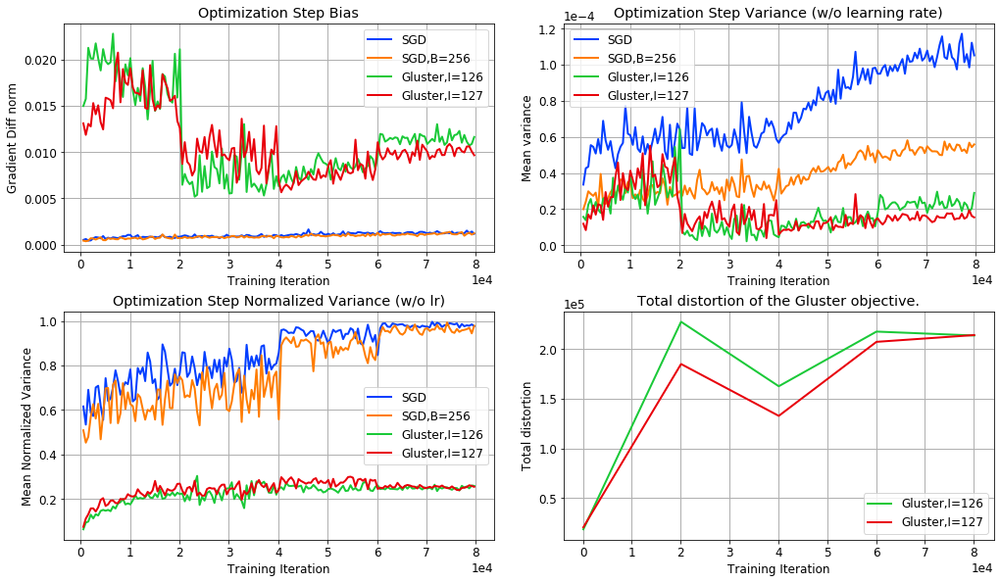

In [518]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_incluster/(00|01|08|09)']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_incluster_gvar.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster']  # g_estim, 'g_nclusters', 
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('g_incluster_', 'I='), ('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* first and last clusters did not show huge flucts, so it is a specific random cluster, more like a mislabeled data

TODO:
* run for all clusters? to find the problematic one?
* imbalance data

# Imbalance

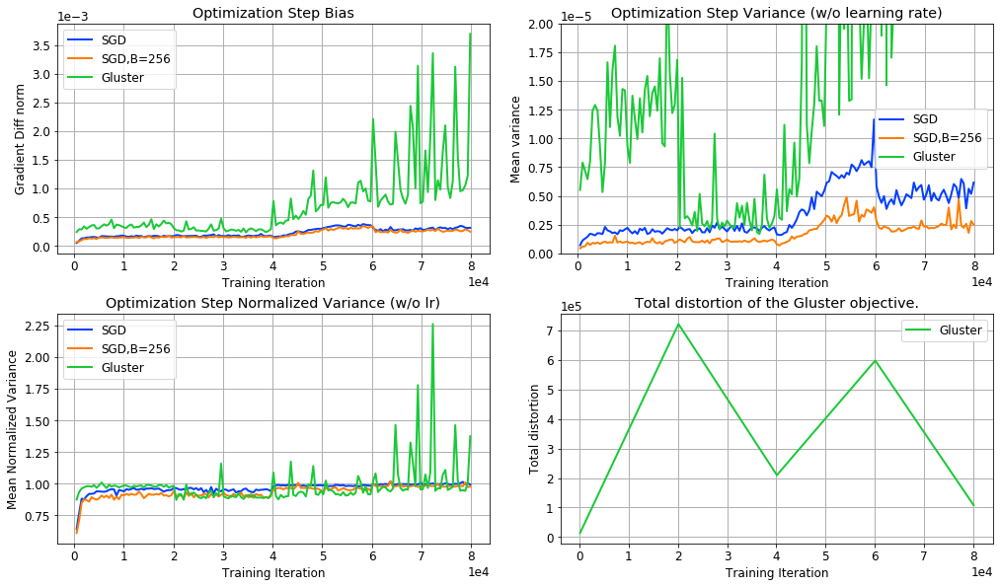

In [535]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/(?!.*imbalance)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_0,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_1,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_0,10']  # (?!.*scheduler)
patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_1,10']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_imbalance.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster']  # g_estim, 'g_nclusters', 
# ylim = [None]*20
ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

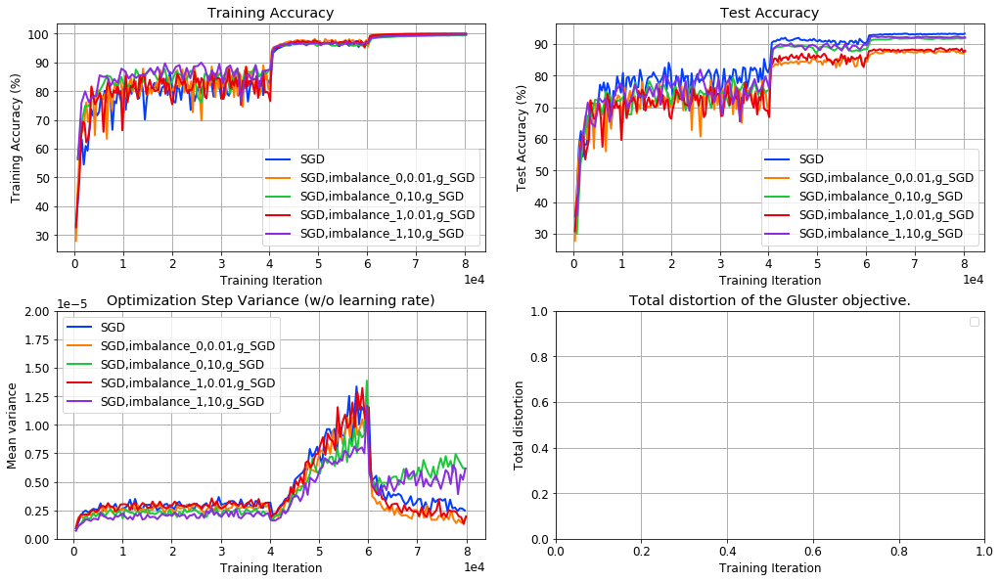

In [545]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/(?!.*imbalance)']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_0,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_1,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_0,10']  # (?!.*scheduler)
# patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/.*imbalance_1,10']  # (?!.*scheduler)
patterns = ['.*runs_cifar10_gvar_resnet32_imbalance/(?!.*gluster)(?!.*batch_size_256)']  # (?!.*scheduler)
tag_names = ['Tacc', 'Vacc', 'est_var', 'gb_td']
fig_name = 'figs_icml2020/cifar10_imbalance.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster', ',imbalance_.,.*,']  # g_estim, 'g_nclusters', 
# ylim = [None]*20
ylim = [None, None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* variance of gluster with imbalance data is worse with any combination
* sgd can overfit to all imbalance data
* more to undersample 0.01, less to oversample
* variance of sgd for undersample is lower than clean data at the end of train
* and higher for oversample

TODO:
* maybe incluster with imbalance?
* maybe train with gluster better, bc this is on traj of sgd overfitting
* for oversample, underweight, for undersample, overweight, how about a robust f on weights?
  - maybe something based on the total distortion divide by the number
* problem is, with raw cifar10, it is not the smallest or largest cluster that's the problem, so a hack by the cluster size might not work
* this doesn't make sense, it might be a bug, why isn't the variance just the same as sgd right after update
  - maybe because it is not right after the update
* any way to test this?
  - run multiple runs, use divisible gvar_niter and bsnap_niter, shift the gvar start
* why is the smallest cluster size 227? another bug?
* ? how to smoothly interpolate between gluster and uniform?

* because the variance is worse, even if we train with gluster, it is going to need smaller lr
* having more imbalanced data in either way is making it hard in cifar10, maybe on mnist it is different

## mnist imbalance

### with dropout

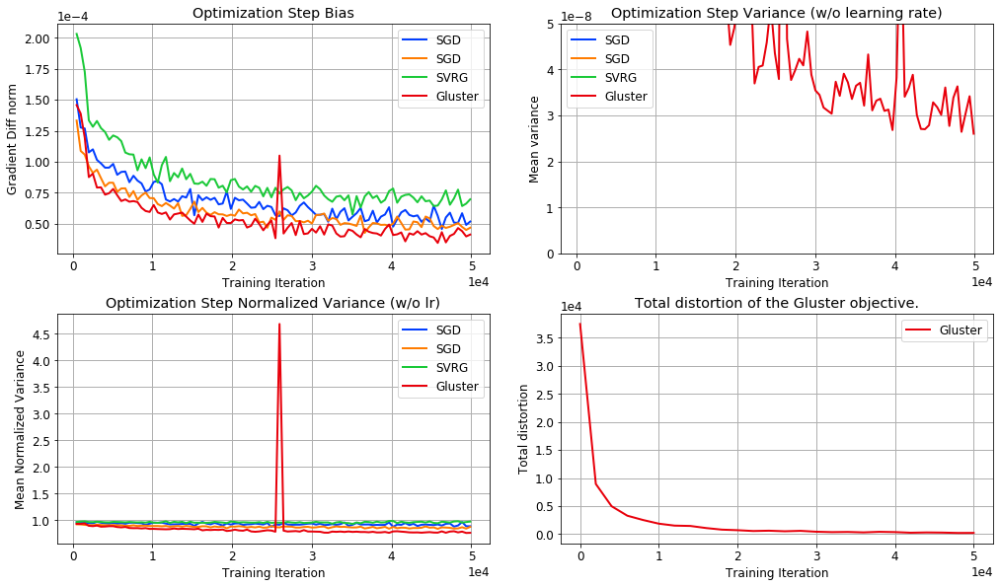

In [573]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar_imbalance_dropout/(?!.*imbalance)']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance_dropout/.*imbalance_0,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance_dropout/.*imbalance_1,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance_dropout/.*imbalance_0,10']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance_dropout/.*imbalance_1,10']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/mnist_imbalance.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster']  # g_estim, 'g_nclusters', 
# ylim = [None]*20
ylim = [None, [0, 5e-08], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* with dropout has spikes

### no dropout

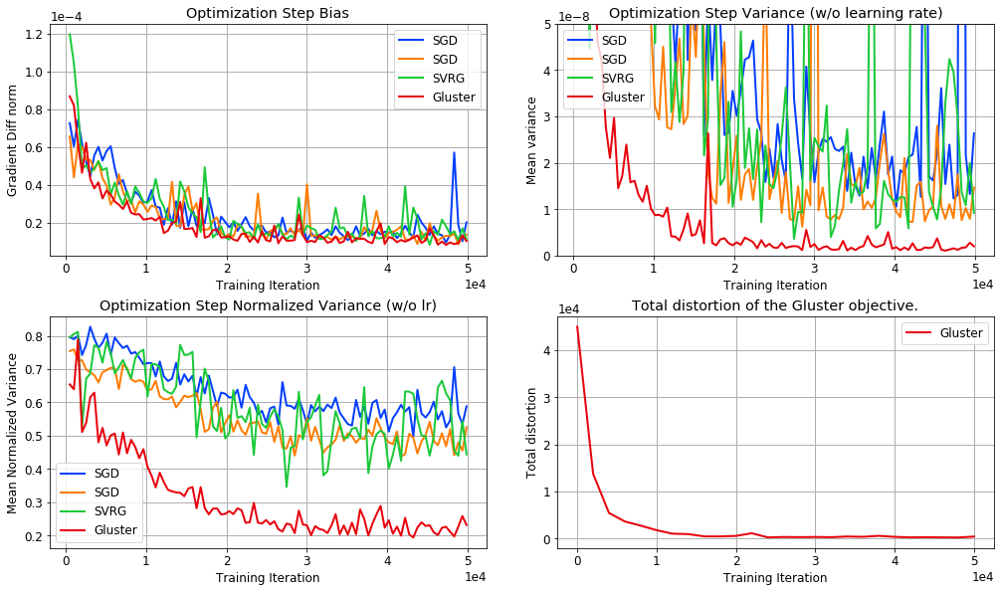

In [568]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar_imbalance/(?!.*imbalance)']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance/.*imbalance_0,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance/.*imbalance_1,0.01']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance/.*imbalance_0,10']  # (?!.*scheduler)
# patterns = ['.*runs_mnist_gvar_imbalance/.*imbalance_1,10']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/mnist_imbalance.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster']  # g_estim, 'g_nclusters', 
# ylim = [None]*20
ylim = [None, [0, 5e-08], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* no dropout matches old results, so code is fine
(old results: ```patterns = ['.*runs_mnist_gvar/.*cnn']  # (?!.*scheduler)```)

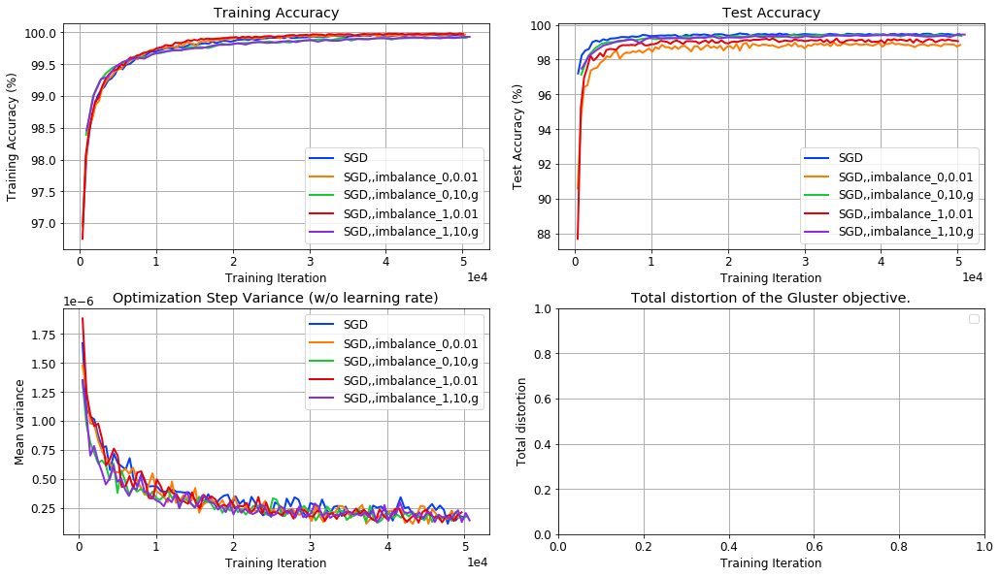

In [560]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_gvar_imbalance/(?!.*gluster|.*svrg)(?!.*batch_size_256)']  # (?!.*scheduler)
tag_names = ['Tacc', 'Vacc', 'est_var', 'gb_td']
fig_name = 'figs_icml2020/mnist_imbalance.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'g_incluster', ',imbalance_......']  # g_estim, 'g_nclusters', 
ylim = [None]*20
# ylim = [None, [0, 5e-08], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* Gluster still provides lower variance on mnist with imbalance data


* mnist, with dropout has spikes but without dropout it has less.
* With dropout the variance for all methods is higher.
* sgd undersampled data generalizes worse
* sgd with oversampled data converges more slowly

TODO:
* no dropout (done)
* done with imbalance then? same general problem?
* jimmy's stuff

Jimmy (april 1):

diff between RF and R kitchen sinks? no diff

- random kitchen sinks and only learns the top layer weights. The label will also be generated by a teacher random kitchen sink. 
- vary the number of hidden units, d, in a random kitchen sink to simulate the three regimes: overparameterized (d >>n) vs under parameterized (n >>d) vs right at the interpolation threshold (n ~= d). 
- ?d >>n, non of the variance reduction methods matter, we verified this hypothesis on linear models
not sure about this that we have verified it
- what is the metric? risk/var reduction
- stochastic setting? var reduction is observed even in linreg gamma=2 with snr=5 (high noise?)


1. S=2*T, D varies with H
2. D/H=gamma, vary teacher model
3. ?


- rate of convergence is the same in overparam, sgd is cheaper
- win in underparam, or interpolation
- when data is very noisy, like teacher more neurons
- optimal sampling for convergence, see what happens with noise and citations
- suspicion, if too underparam it won't work well either
- 1 neuron and multineuron example
- even cifar10 corrupt labels shows the same thing, corrupt labels reduces the power of model to overfit and brings it down to underparam

params:
- h_s: student hidden
- h_t: teacher hidden
- n: number of training data
- d: input dim


1. h_t/h_s=2 (underparam), vary n
2. n/h_s=2 (underparam), vary h_t

David:
- mnist is underparam or overparam?
- for paper, assume objective is fine, ignore generalization, say that upfront
- bert? self-supervised, reconstruction, underparam
- 1 week on random features then bert
- pretrained bert with downstream tasks

# CIFAR-10 ResNet110

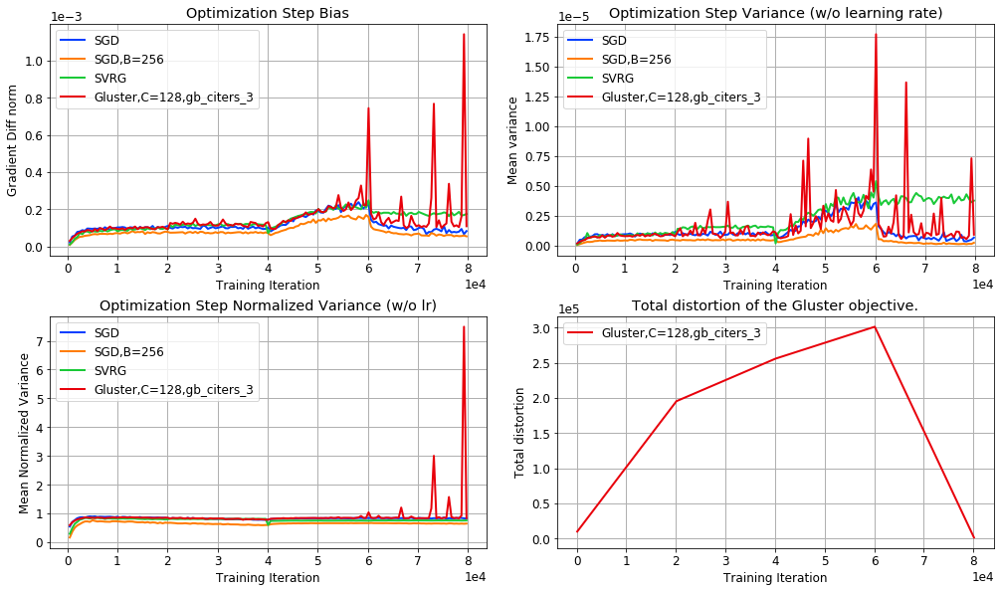

In [580]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet110/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet110.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'gb_citers']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* (not true) the fluctuations seem to be less than resnet32 and resnet 8 but they still exist
* citers 3
* why is the smallest cluster so big?
  - old results with osnap are almost the same, a few clusters below 100
  - different on mnist, old results with online had lots of clusters below 100, same is true with new and batch but fewer clusters with very few examples
  - with resnet110, it is highly balanced
* why do duplicates change things? it doesn't make sense in RF.

# CIFAR-10 sampling

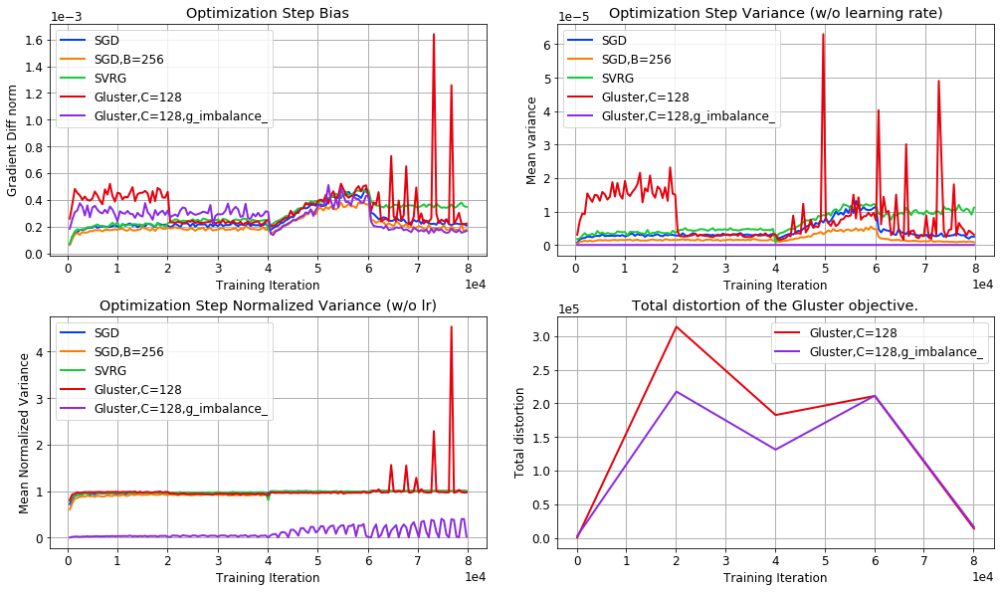

In [584]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet32_sampling/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_sampling.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_imbalance']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

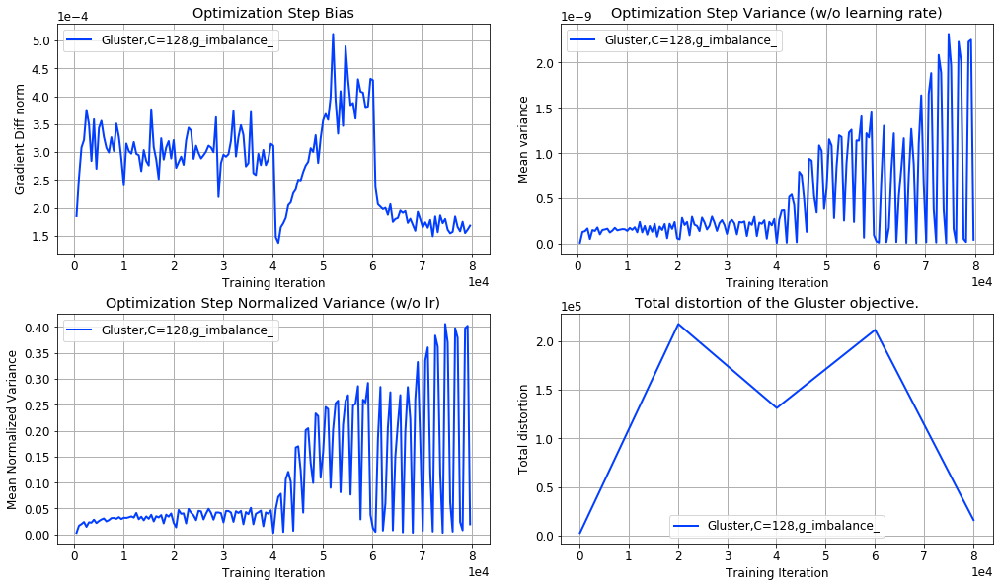

In [585]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet32_sampling/.*imbalance']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_sampling.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size', 'g_imbalance']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

Nk/N=0 -> xX
Nk/N=Nk0/N -> x1
Nk/N=1 -> /X

Nk0=N/M

TODO:
* spikes are probably because of largest cluster
* no var reduction is because SGC is null

# robust

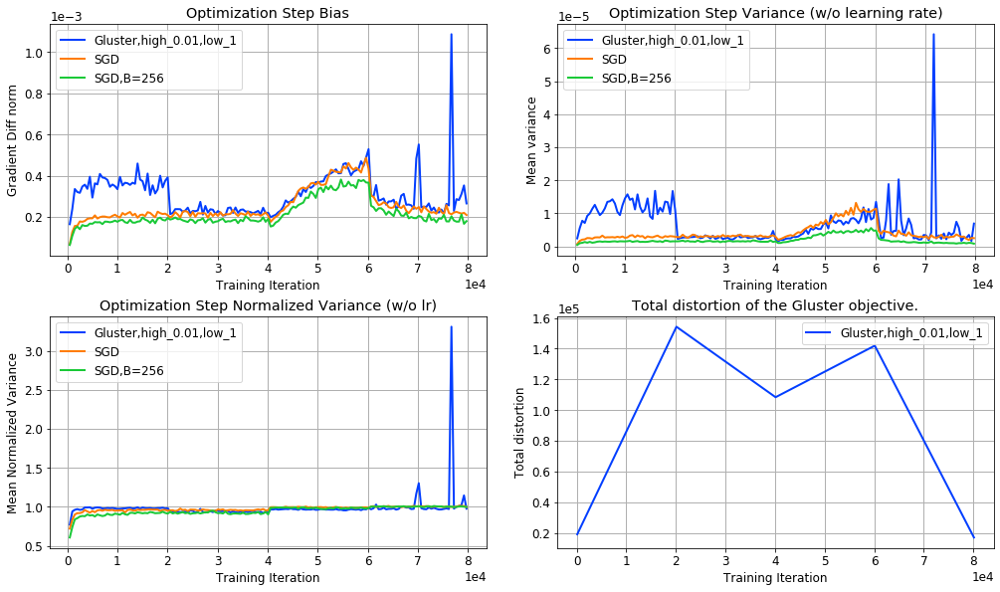

In [621]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_gvar_resnet32_robust/.*high_0.01,.*low_1$|.*runs_cifar10_gvar_resnet32_sampling/.*estim_sgd']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_icml2020/cifar10_resnet32_robust.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'batch_size', 'high_', 'low_']  # g_estim
ylim = [None]*20
# ylim = [None, [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 5
no_title = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

* fluctuations are caused by the largest cluster, it is a numerical problem with finite samples that we can resolve with a hack like scaling the largest Nk
* random resnet experiment shows the variance at a lr is a function of the architecture

David (Apr 17)
* gradient noise as a f of learning rate
  - wider range of lr
  - short term
  - notice the last part of lr regime
  - should it be the center?
* sketch it first, convey it to jimmy and david
  - first RF
  - then gluster
  - then experiments where gluster work
  - then experiments where it doesn't work
  - in bullets like your email
  
* fluctuations
  - reweight by prob under the model
    + as a f of dist
* BERT

NLP stuff in figures_nlp.ipynb

# imagenet duplicates

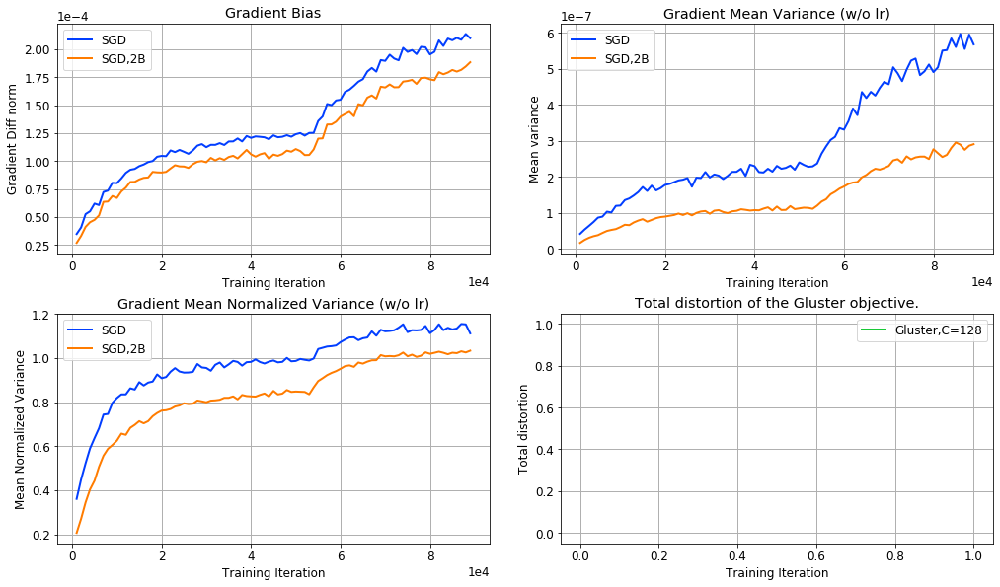

In [976]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth_o1
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_imagenet_gvar_dup10,100000/']  # (?!.*scheduler)
tag_names = ['grad_bias', 'est_var', 'est_nvar', 'gb_td']
fig_name = 'figs_neurips2020/imagenet_resnet18_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'g_batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 3
no_title = False
save_single = False
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',g_B=128', ''), (',g_B=256', ',2B')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title)

- online was always high variance on imagenet (Jan 6 2019 runs_imagenet_gvar in figures_gvar.ipynb)
- old g_beta .9, min_size 1 which caused lots of reinits

# NQM (online)

train with goptim

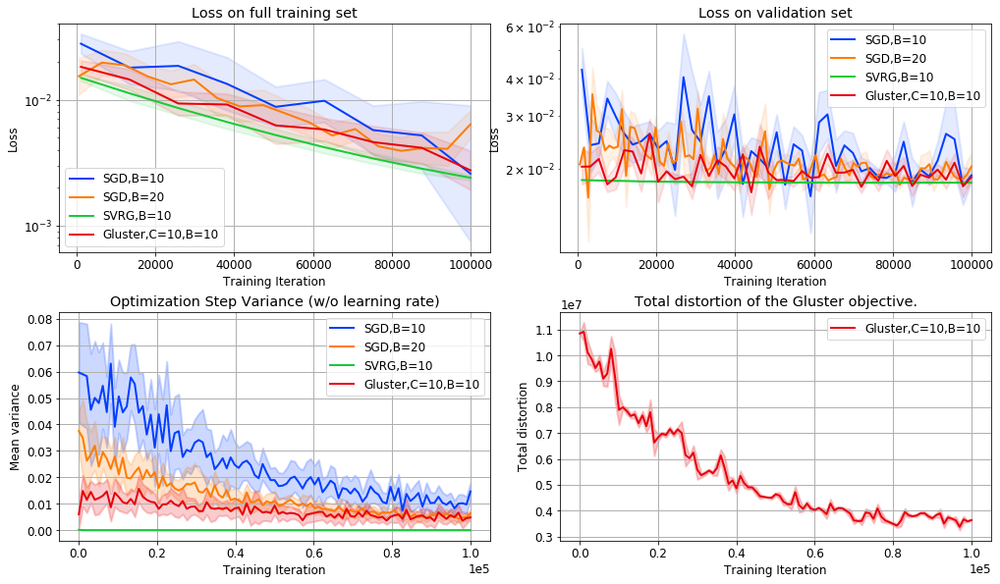

In [940]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_online_dup100,100/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/linereg_online_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
save_single = False
smooth_div_ns = [10, 2, 10, 1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

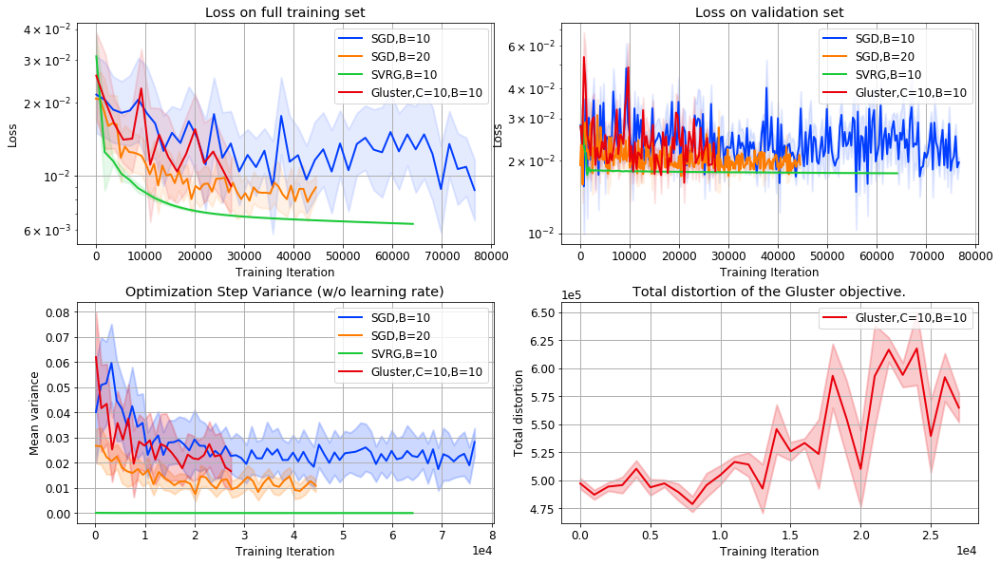

In [941]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_online_dup10,100/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/linereg_online_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
save_single = False
smooth_div_ns = [10, 2, 10, 1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

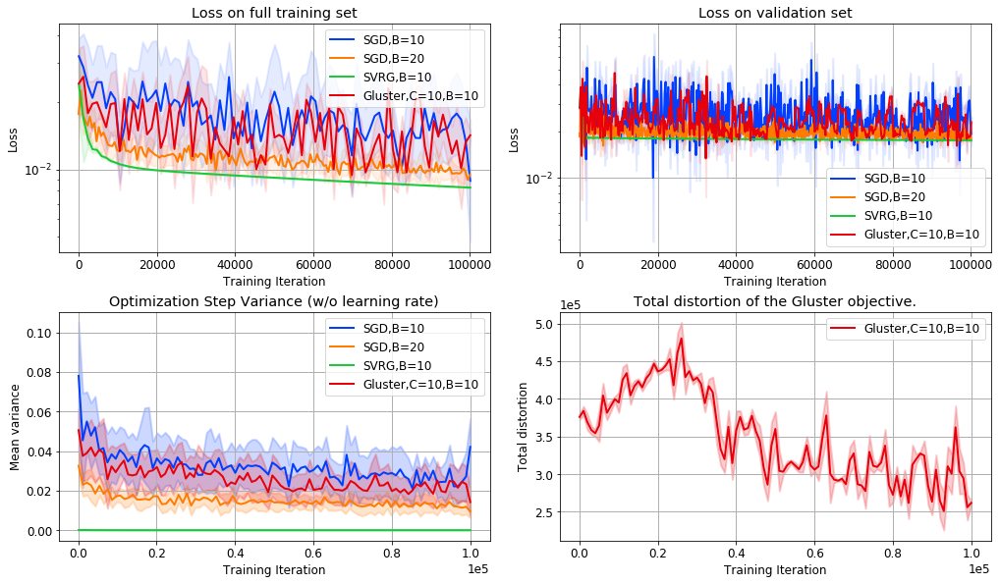

In [942]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_online_dup5,100/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/linereg_online_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
save_single = False
smooth_div_ns = [10, 2, 10, 1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

- 100,100: VGluster < VSGD2B
- 10,100: 2B < VGluster < B
- 5,100: 2B < VGluster < B (but better)

## gvar no goptim

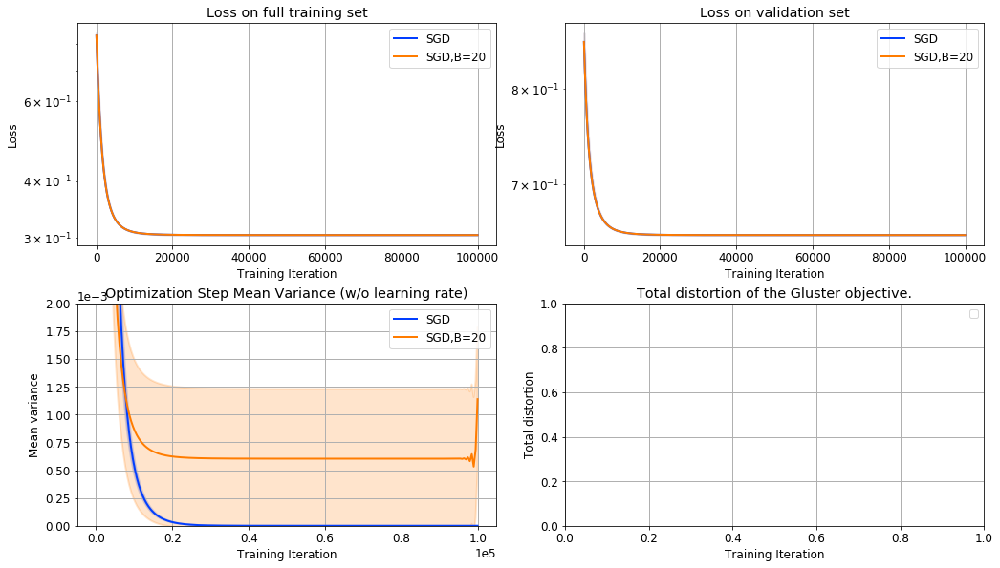

In [975]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_gvar_online_S1/.*estim_sgd']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/nqm.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'g_batch_size']  # g_estim
# ylim = [None]*20
ylim = [None, None, [0, 0.002], None]
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
save_single = False
smooth_div_ns = [1, 5, 5, 1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', ''), ('g_B', 'B'), (',B=10', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

save fig

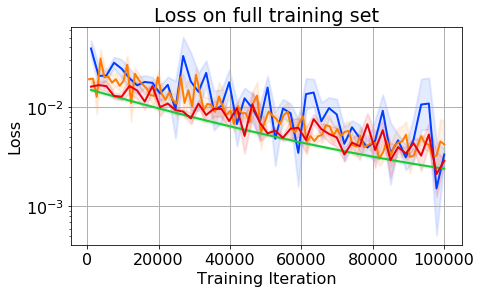

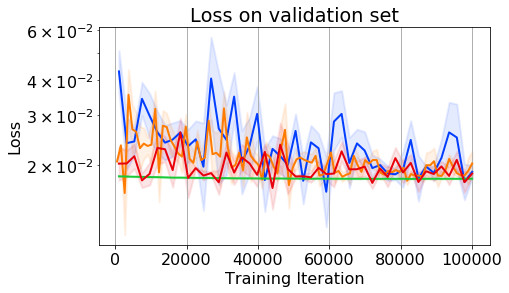

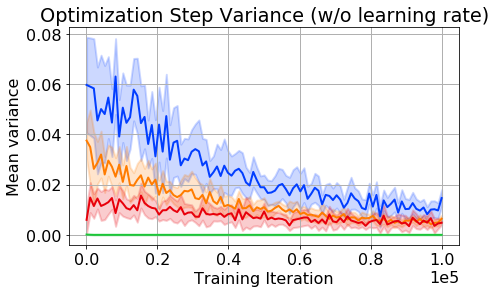

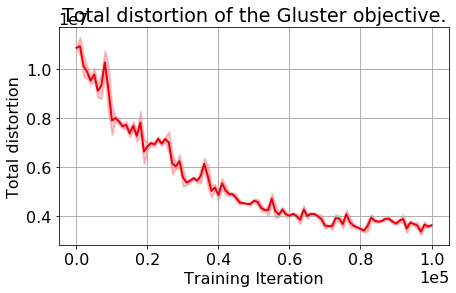

<Figure size 504x288 with 0 Axes>

In [944]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth_shade
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_linreg_online_dup100,100/']  # (?!.*scheduler)
tag_names = ['Tloss', 'Vloss', 'est_var', 'gb_td']
fig_name = 'figs_neurips2020/linereg_online_dup.png'
lg_tags = ['estim_sgd', 'svrg', 'gluster', 'g_nclusters', 'batch_size']  # g_estim
ylim = [None]*20
# ylim = [[1e-4, 6e-4], [0, 2e-5], None, None, None, None]
# ylim = [[1e-4, 1e-1], [1e-2, 1e-1], [98, 100], [97,100], [0, 100], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = True
ncolor = 4
no_title = False
save_single = True
smooth_div_ns = [2, 2, 10, 1]
lg_replace = [('estim_sgd', 'sgd'), (' ', ','), ('g_nclusters_', 'C='), ('sgd', 'SGD'), ('svrg', 'SVRG'), ('gluster', 'Gluster'), ('g_osnap_iter_', 'Oi='), ('g_beta_', 'beta='), ('g_min_size_', 'sz='), ('duplicate_10', 'Dup'), ('batch_size_', 'B='), (',B=128', '')]
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h, ncolor=ncolor, lg_replace=lg_replace, save_single=save_single, no_title=no_title, smooth_div_ns=smooth_div_ns)

PROBLEM: Gluster is not directly applicable to NQM unless the setting is.
modified to process batches of data multiple times. That makes theoretical.
arguments much harder.